In [7]:
#This code serves the purpose of parsing .csv RW5 files created by the Carlson Report Generator
#and .xlsx files created by the Omega Digital Transducer Application

#Created for the fulfillment of the CUAHSI Hydroinformatics Innovation Fellowship
#by Morgan Harbin
#Embry-Riddle Aeronautical University Department of Civil Engineering
#Environmental Sustainability and Resilience Program

In [8]:
#HARDCODE: enter the name of your files to be imported

#NOTE: before importing .rw5 file,
#use the Carlson converter tool to produce a .csv version of your raw .rw5
#Carlson Report Generator: http://www.carlsonemea.com/cwa/report/index.php?lang=RO

surface = 'Sand(soft)' #Single-word surface
location = 'Ormond'  #Single-word location

rw5_files = ['CUAHSI_Ormond1.rw5.csv', 'CUAHSI_Ormond2.rw5.csv', 'CUAHSI_Ormond3.rw5.csv', 'CUAHSI_Ormond4.rw5.csv'] #dictionary with file names
INUSBH_files = ['CUAHSI_Ormond1.xlsx', 'CUAHSI_Ormond2.xlsx', 'CUAHSI_Ormond3.xlsx', 'CUAHSI_Ormond4.xlsx']

load_delta_values = []

Z_delta_values = []

area_toposhoe = 2.95

In [9]:
#Import necessary libraries

import pandas as pd
import requests
import matplotlib.pyplot as plt
import numpy as np
import urllib.request as url
from urllib.request import urlopen
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
from datetime import datetime
from datetime import date
import math
from scipy.signal import butter, filtfilt
from pandas import Timestamp

from matplotlib.lines import Line2D # for the legend
from sklearn.linear_model import LinearRegression

!pip install matplotlib-label-lines
import matplotlib.pyplot as plt
from labellines import labelLines

In [10]:
#Define filtering functions to be used later for data analysis

def butter_lowpass(cutoff, fs, order=5):
  from scipy.signal import butter, filtfilt
  nyq = 0.5 * fs
  normal_cutoff = cutoff / nyq
  b, a = butter(order, normal_cutoff, btype='low', analog=False)
  return b, a

def butter_lowpass_filtfilt(data, cutoff, fs, order=5):
  from scipy.signal import butter, filtfilt
  b, a = butter_lowpass(cutoff, fs, order=order)
  y = filtfilt(b, a, data)
  return y

#https://stackoverflow.com/questions/28536191/how-to-filter-smooth-with-scipy-numpy

def to_integer(dt_time):
    return 10000*dt_time.year + 100*dt_time.month + dt_time.day

#https://stackoverflow.com/questions/28154066/how-to-convert-datetime-to-integer-in-python

def take_closest(myList, myNumber):

  from bisect import bisect_left

  pos = bisect_left(myList, myNumber)
  if pos == 0:
      return myList[0]
  if pos == len(myList):
      return myList[-1]
  before = myList[pos - 1]
  after = myList[pos]
  if after - myNumber < myNumber - before:
    return after
  else:
      return before

# https://stackoverflow.com/questions/12141150/from-list-of-integers-get-number-closest-to-a-given-value

def printTable(myDict, colList=None, sep='\uFFFA'):
   """ Pretty print a list of dictionaries (myDict) as a dynamically sized table.
   If column names (colList) aren't specified, they will show in random order.
   sep: row separator. Ex: sep='\n' on Linux. Default: dummy to not split line.
   Author: Thierry Husson - Use it as you want but don't blame me.
   """
   if not colList: colList = list(myDict[0].keys() if myDict else [])
   myList = [colList] # 1st row = header
   for item in myDict: myList.append([str(item[col] or '') for col in colList])
   colSize = [max(map(len,(sep.join(col)).split(sep))) for col in zip(*myList)]
   formatStr = ' | '.join(["{{:<{}}}".format(i) for i in colSize])
   line = formatStr.replace(' | ','-+-').format(*['-' * i for i in colSize])
   item=myList.pop(0); lineDone=False
   while myList or any(item):
      if all(not i for i in item):
         item=myList.pop(0)
         if line and (sep!='\uFFFA' or not lineDone): print(line); lineDone=True
      row = [i.split(sep,1) for i in item]
      print(formatStr.format(*[i[0] for i in row]))
      item = [i[1] if len(i)>1 else '' for i in row]

# https://stackoverflow.com/questions/17330139/python-printing-a-dictionary-as-a-horizontal-table-with-headers

In [11]:
def smooth_and_slice(Load,TimeINUSBH):

  global Load_smooth
  global inflectionMidpoint
  global inflectionMidpointTrack
  global dictLoad
  global dictTimeINUSBH


  Load_smooth = butter_lowpass_filtfilt(Load, cutoff, fs);

  sign = 1;
  inflection = [];
  inflectionMidpointTrack = [TimeINUSBH[0]];

  for i in range(0,len(Load)-1):
    sign0 = sign;
    point1 = Load_smooth[i];
    point2 = Load_smooth[i+1];
    pointDiff = point2 - point1;

    if pointDiff < 0:
      sign = 0;

    else:
      sign = 1;

    if sign != sign0:
      inflection.append(TimeINUSBH[i]);

    if len(inflection) > 1:
      #Find midpoint of inflection points
      delta = inflection[1] - inflection[0];
      inflectionMidpoint = inflection[1] + (delta/2);

      #Split dataset at inflectionMidpoint
      inflectionMidpointTrack.append(inflectionMidpoint);
      inflection = [];

  inflectionMidpointTrack.append(TimeINUSBH[-1]);

  dictLoad = {};
  dictTimeINUSBH = {};

  for i in range(0, len(inflectionMidpointTrack)-1):
    #Define new list between inflection midpoints
    slice1 = take_closest(TimeINUSBH, inflectionMidpointTrack[i]);
    sliceIndex1 = TimeINUSBH.index(slice1);

    slice2 = take_closest(TimeINUSBH, inflectionMidpointTrack[i+1]);
    sliceIndex2 = TimeINUSBH.index(slice2);

    dictLoad['L' + str(i)] = Load[sliceIndex1:sliceIndex2];
    dictTimeINUSBH['T' + str(i)] = TimeINUSBH[sliceIndex1:sliceIndex2];

  return Load_smooth, inflectionMidpoint, inflectionMidpointTrack

[2.2789, 2.3341, 2.344, 2.3484, 2.3488, 2.3398, 2.3301, 2.3214, 2.3236, 2.3212, 2.3117, 2.2989, 2.2943, 2.2847, 2.2821, 2.2766, 2.2682, 2.2645, 2.2496, 2.2259, 2.2305, 2.2271, 2.225, 2.2224, 2.2188, 2.2059, 2.2384, 2.2672, 2.1864, 2.1814, 2.1803, 2.1848, 2.1842, 2.1853, 2.1848, 2.4045, 2.3612, 2.2683, 2.2479, 2.2443, 2.2429, 2.2423, 2.2411, 2.2375, 2.2358, 2.2324, 2.2297, 2.2276, 2.3148, 2.3737, 2.338, 2.2296, 2.1747, 2.1625, 2.1534, 2.1493, 2.1563, 2.1563, 2.1552, 2.1543, 2.1952, 2.3515, 2.3875, 2.382, 2.3407, 2.3157, 2.3106, 2.3113, 2.3091, 2.305, 2.2974, 2.293, 2.2492, 2.2526, 2.2532, 2.2526, 2.2524, 2.4028, 2.2643, 2.2604, 2.2531, 2.2492, 2.256, 2.2559, 2.2556, 2.2558, 2.2613, 2.4545, 2.4735, 2.4065, 2.3621, 2.3377, 2.3329, 2.3372, 2.3336, 2.3131, 2.3262, 2.2903, 2.2899, 2.2958, 2.2867, 2.2887, 2.4155, 2.3423, 2.2996, 2.2792, 2.2463, 2.2527, 2.2508, 2.2516, 2.2519, 2.2515, 2.2511, 2.2487, 2.4697, 2.471, 2.4046, 2.3631, 2.3505, 2.3546, 2.3367, 2.3344, 2.3328, 2.3295, 2.3274, 2.3254,

<ipython-input-12-09d82a07d58b>:303: RuntimeWarning: divide by zero encountered in scalar divide
  valueZ_current = (Z_N - Z_Nm1)/(TZ_N - TZ_Nm1)
<ipython-input-12-09d82a07d58b>:329: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(2);


length of delLoadValues #0: 17
length of delZValues #0: 17

delLoad: [9.82, 35.46, 35.13, 34.71, 34.93, 25.42, 34.68, 34.72, 34.65, 34.7, 34.79, 34.65, 10.51, 34.66, 35.05, 34.65, 10.37]
delZ: [0.0, 0.25, 0.22, 0.2, 0.17, 0.17, 0.16, 0.13, 0.14, 0.19, 0.23, 0.21, 0.78, 0.32, 0.42, 0.29, 0.0]

[2.598, 2.5996, 2.6021, 2.5992, 2.6071, 2.6067, 2.6021, 2.7125, 2.6588, 2.6211, 2.6114, 2.6071, 2.6078, 2.6048, 2.6064, 2.6122, 2.6094, 2.6111, 2.611, 2.61, 2.6073, 2.6346, 2.594, 2.6011, 2.6018, 2.6005, 2.6005, 2.6023, 2.586, 2.7916, 2.8393, 2.7992, 2.6799, 2.6725, 2.6766, 2.674, 2.6745, 2.675, 2.6757, 2.6767, 2.678, 2.681, 2.6787, 2.6515, 2.6489, 2.6498, 2.6495, 2.6497, 2.6443, 2.6442, 2.6252, 2.8761, 2.824, 2.7011, 2.7007, 2.6933, 2.7015, 2.6971, 2.7001, 2.693, 2.6983, 2.6985, 2.6992, 2.7, 2.7003, 2.6902, 2.6971, 2.6935, 2.6845, 2.6801, 2.6887, 2.6875, 2.6878, 2.681, 2.8691, 2.8616, 2.8561, 2.8105, 2.8133, 2.818, 2.8097, 2.8077, 2.8106, 2.8045, 2.8026, 2.8096, 2.8017, 2.8052, 2.8046, 2.7958, 2.

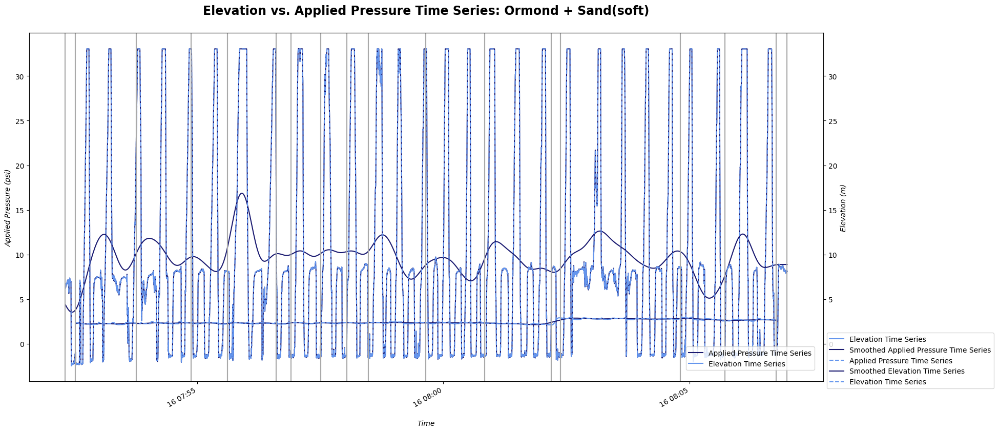

<Figure size 300x1200 with 0 Axes>

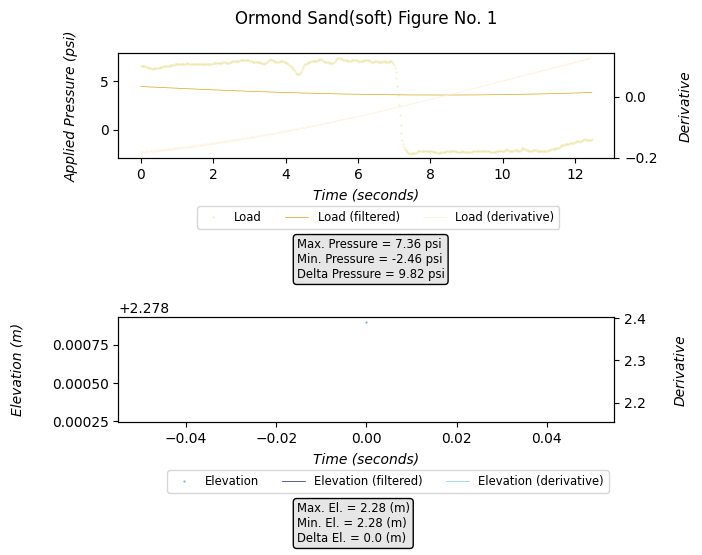

<Figure size 300x1200 with 0 Axes>

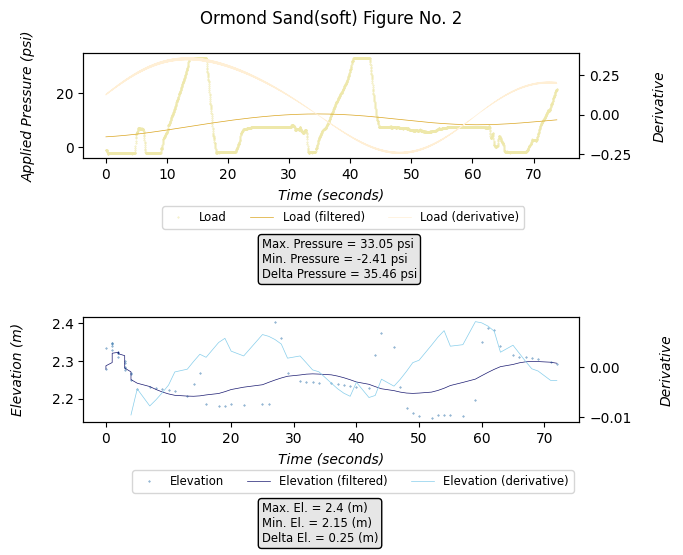

<Figure size 300x1200 with 0 Axes>

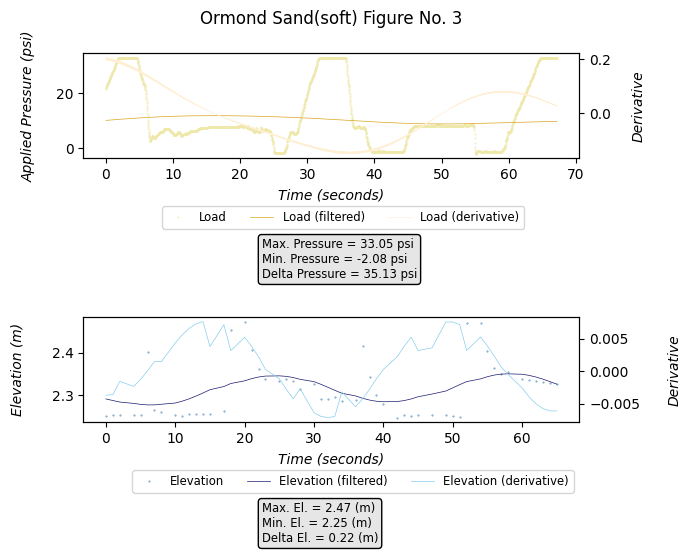

<Figure size 300x1200 with 0 Axes>

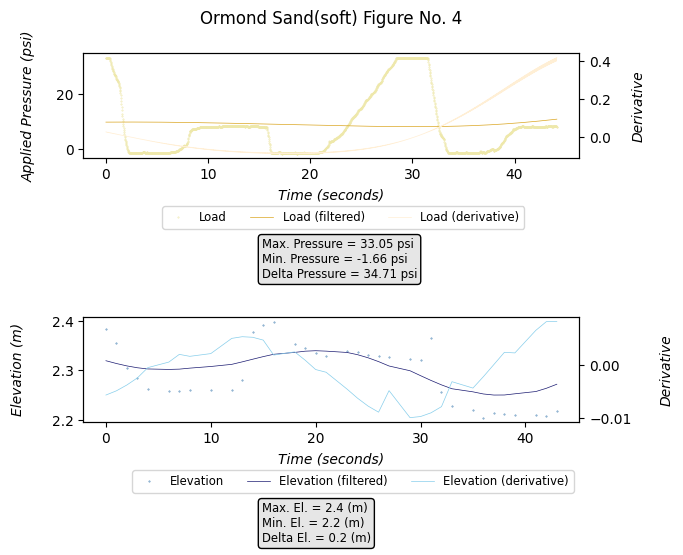

<Figure size 300x1200 with 0 Axes>

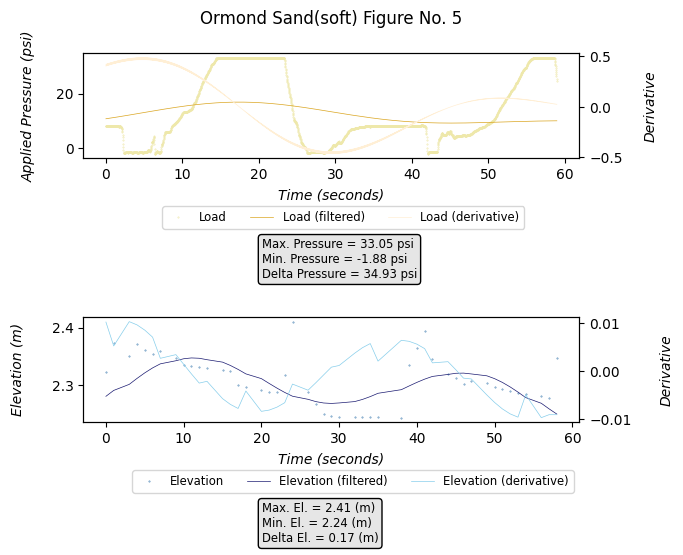

<Figure size 300x1200 with 0 Axes>

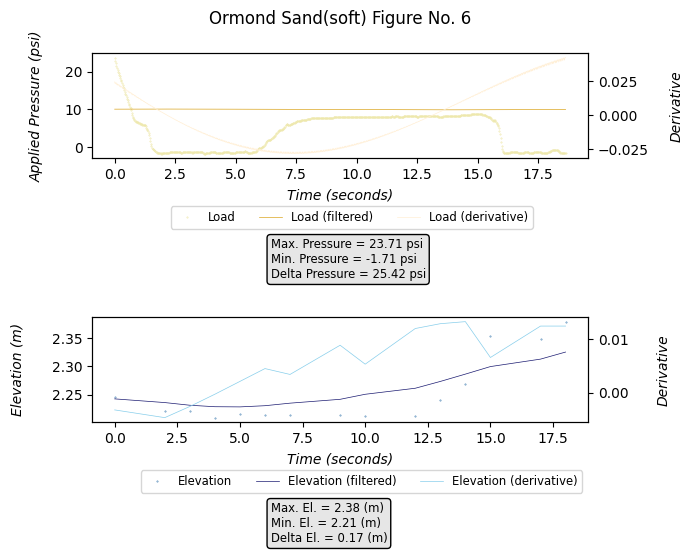

<Figure size 300x1200 with 0 Axes>

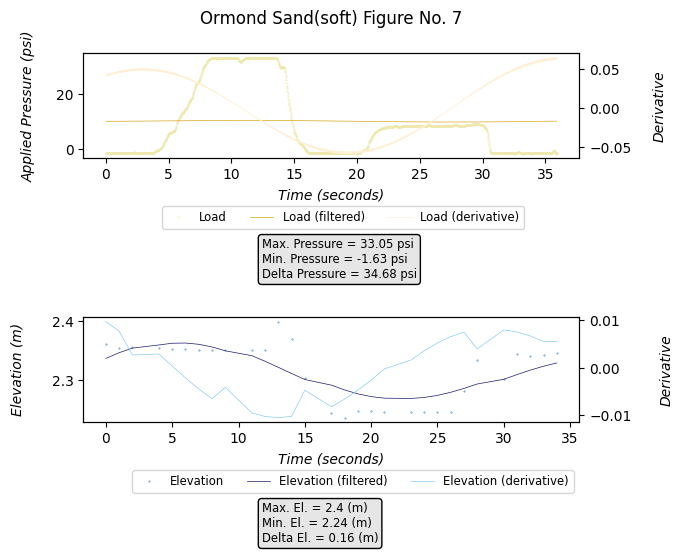

<Figure size 300x1200 with 0 Axes>

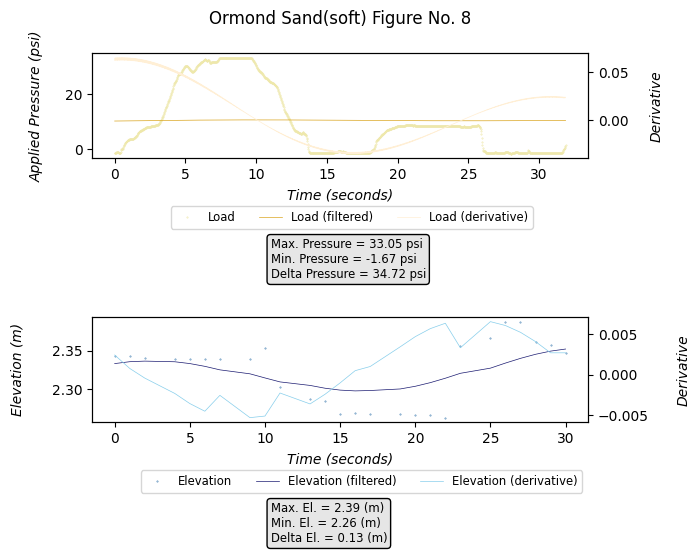

<Figure size 300x1200 with 0 Axes>

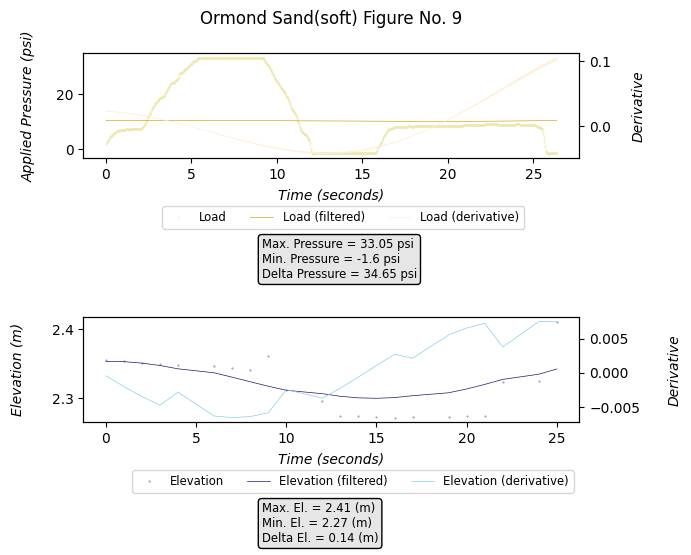

<Figure size 300x1200 with 0 Axes>

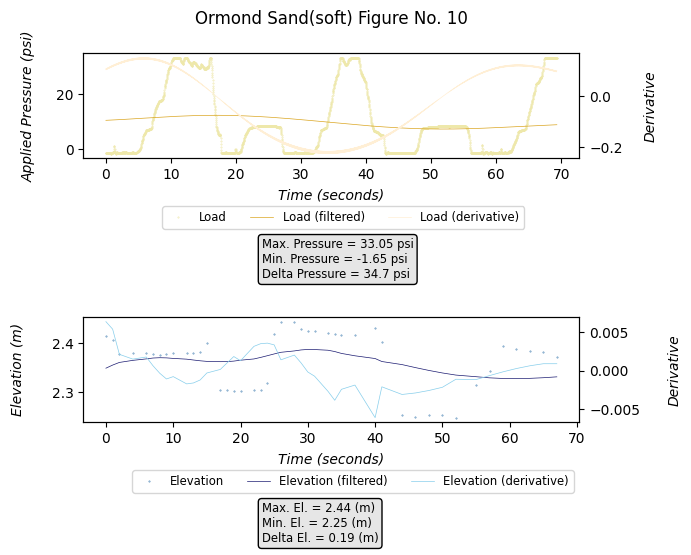

<Figure size 300x1200 with 0 Axes>

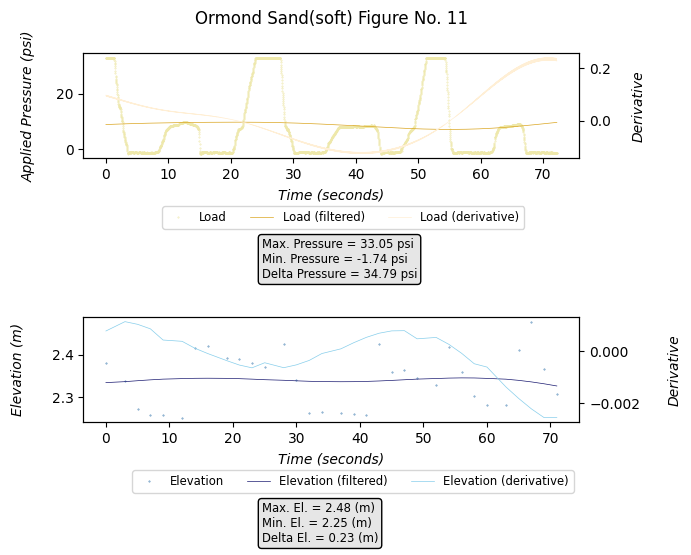

<Figure size 300x1200 with 0 Axes>

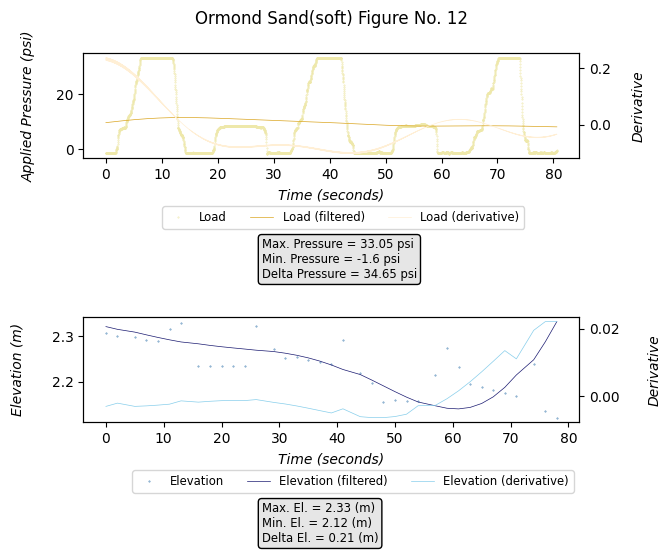

<Figure size 300x1200 with 0 Axes>

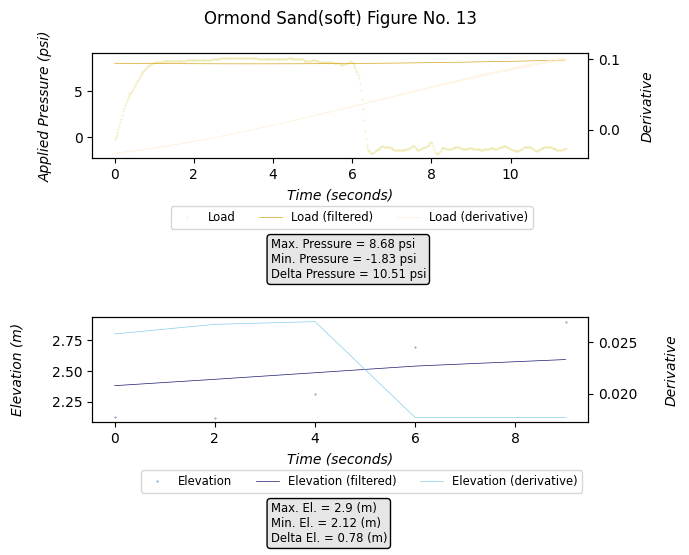

<Figure size 300x1200 with 0 Axes>

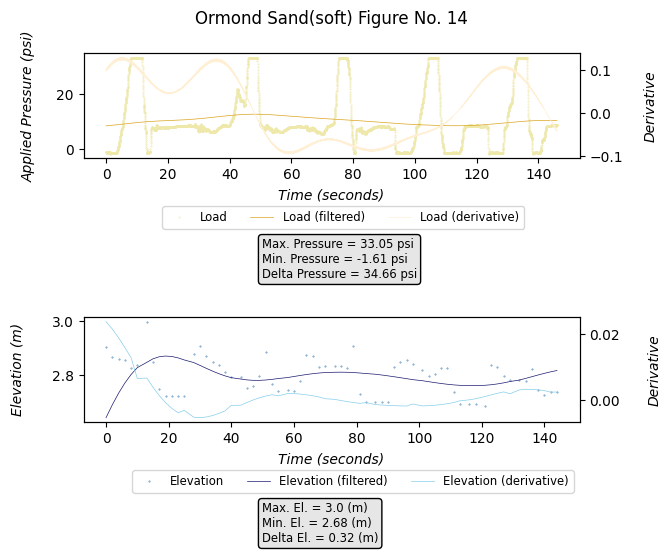

<Figure size 300x1200 with 0 Axes>

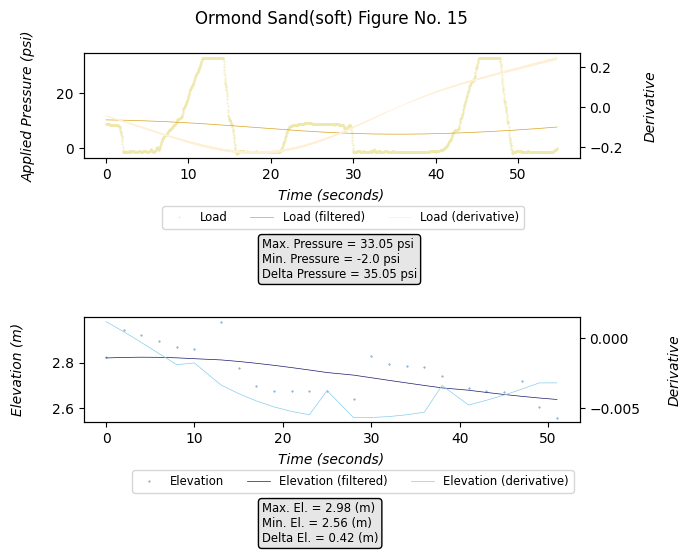

<Figure size 300x1200 with 0 Axes>

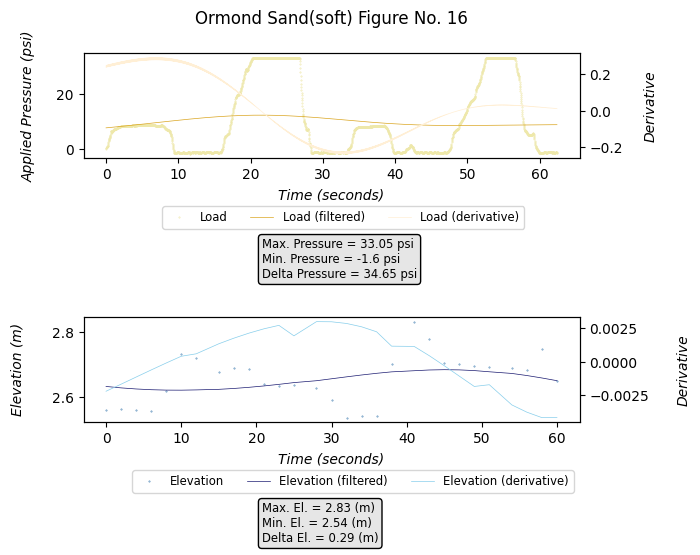

<Figure size 300x1200 with 0 Axes>

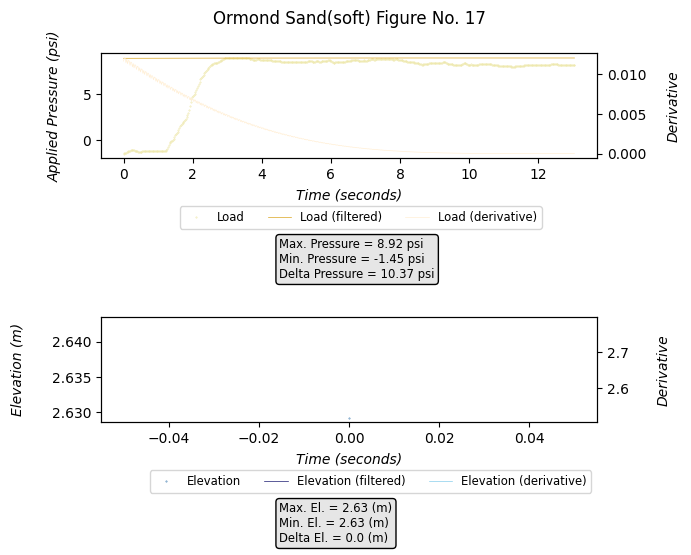

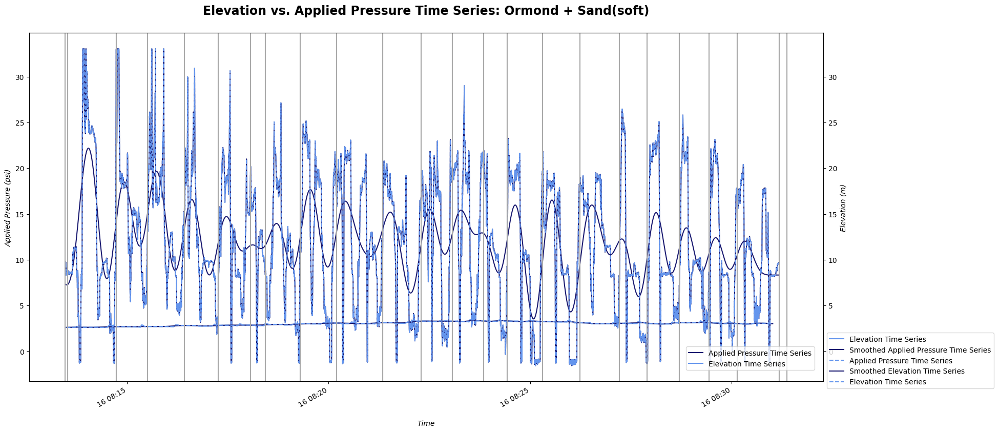

<Figure size 300x1200 with 0 Axes>

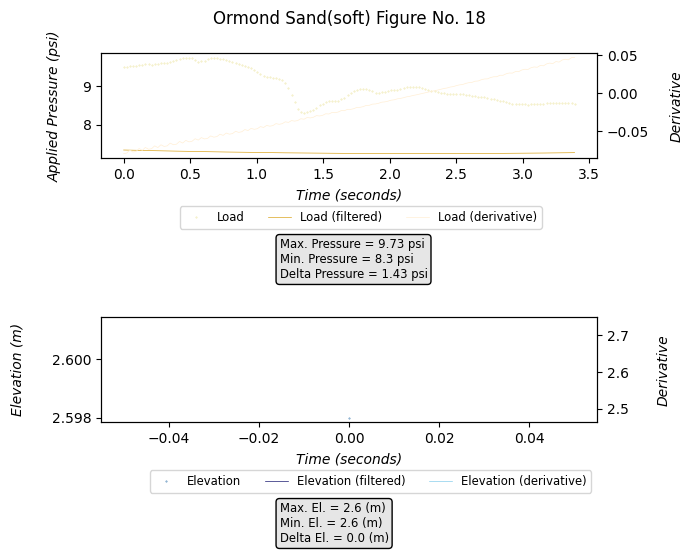

<Figure size 300x1200 with 0 Axes>

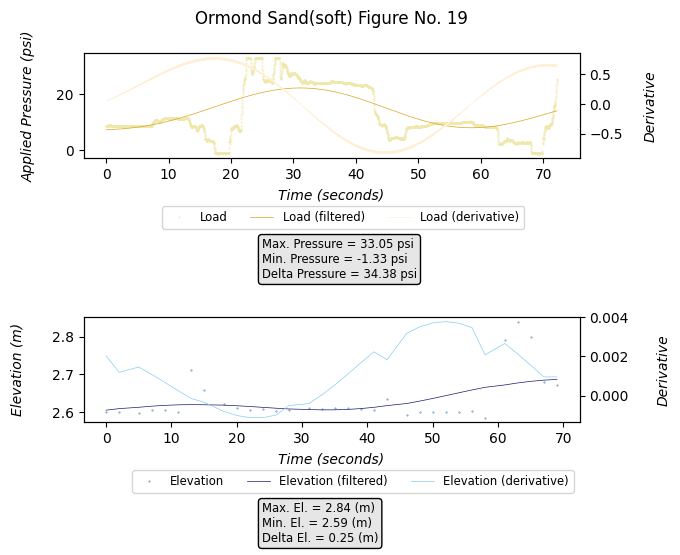

<Figure size 300x1200 with 0 Axes>

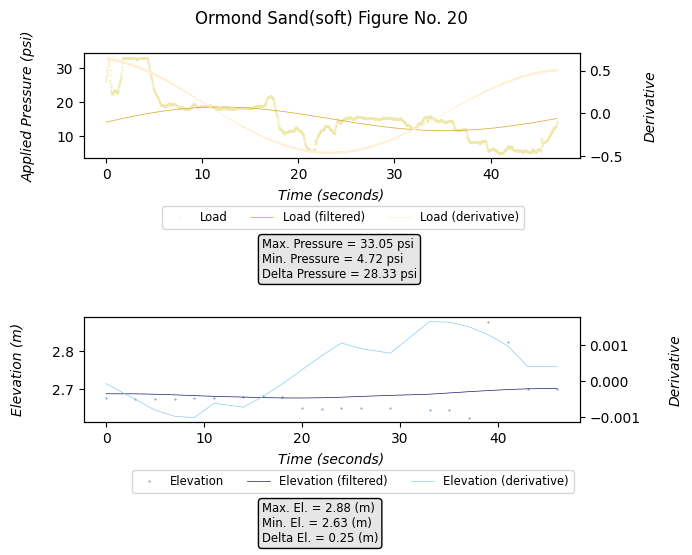

<Figure size 300x1200 with 0 Axes>

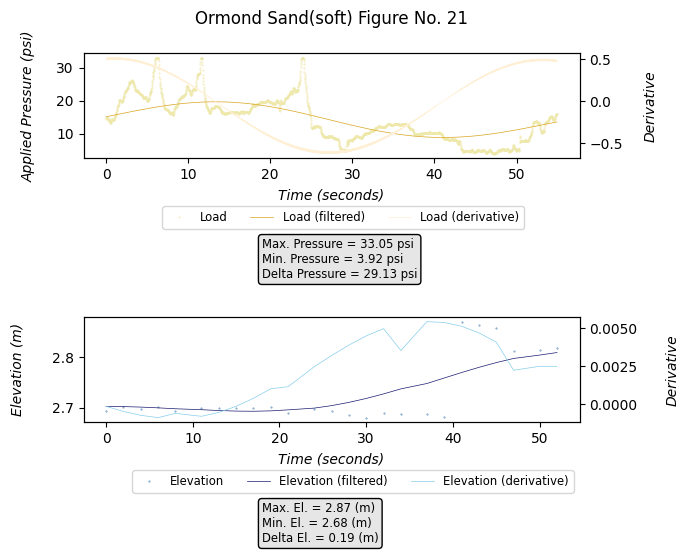

<Figure size 300x1200 with 0 Axes>

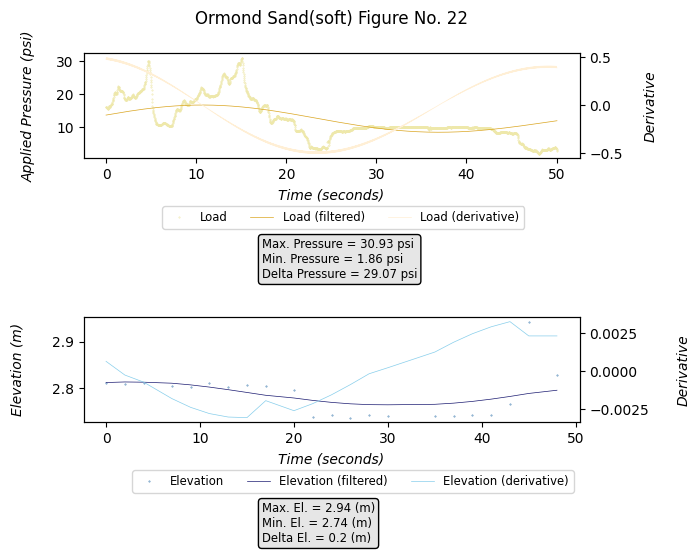

<Figure size 300x1200 with 0 Axes>

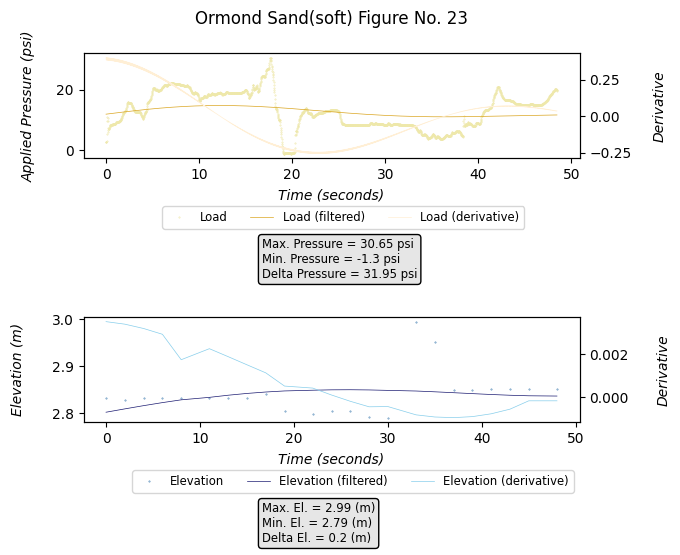

<Figure size 300x1200 with 0 Axes>

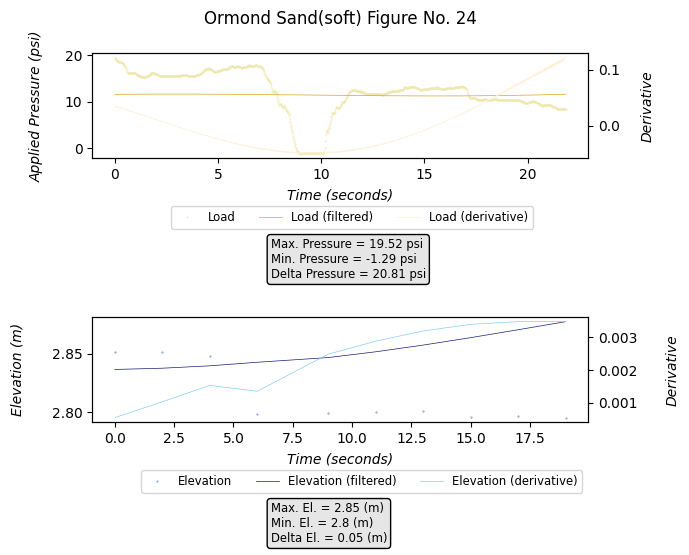

<Figure size 300x1200 with 0 Axes>

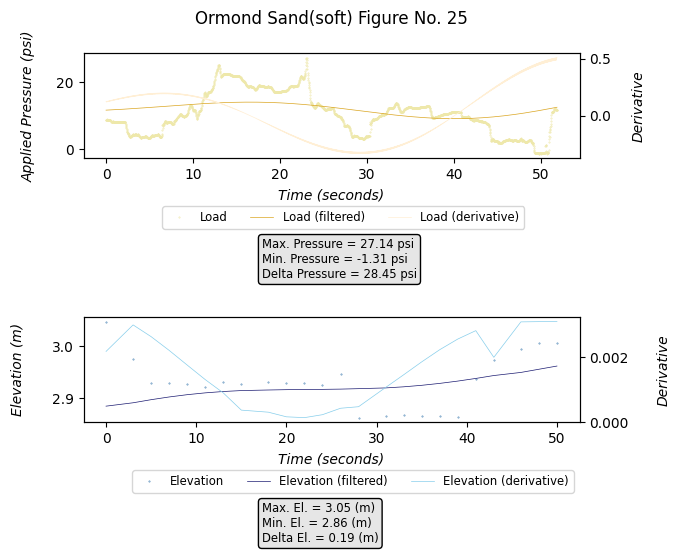

<Figure size 300x1200 with 0 Axes>

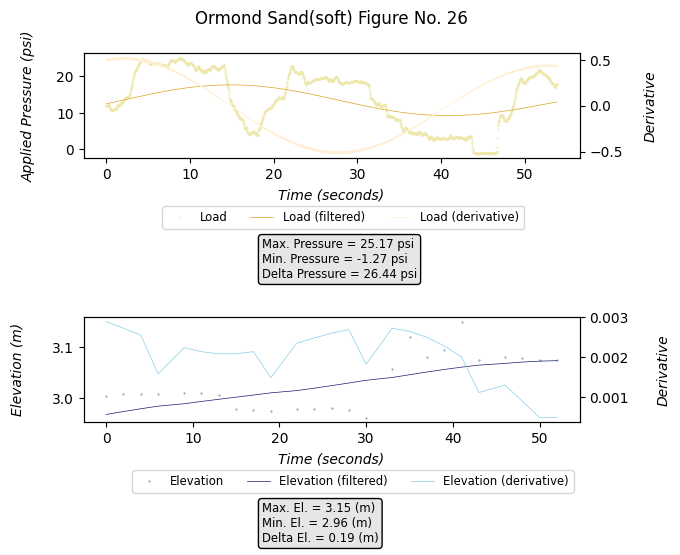

<Figure size 300x1200 with 0 Axes>

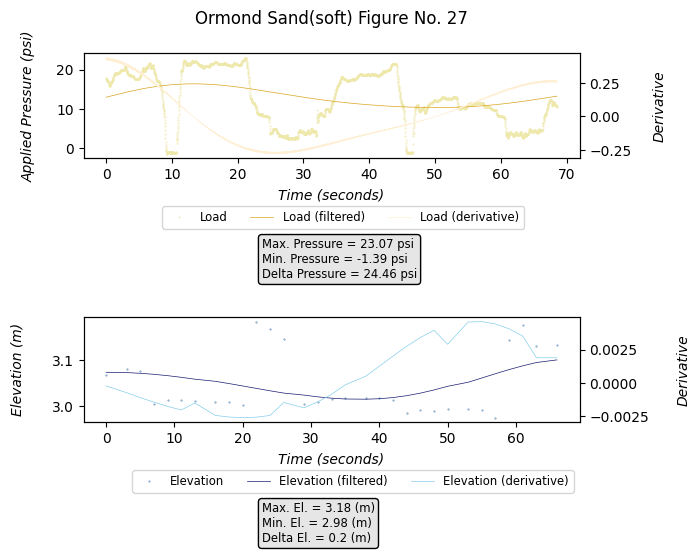

<Figure size 300x1200 with 0 Axes>

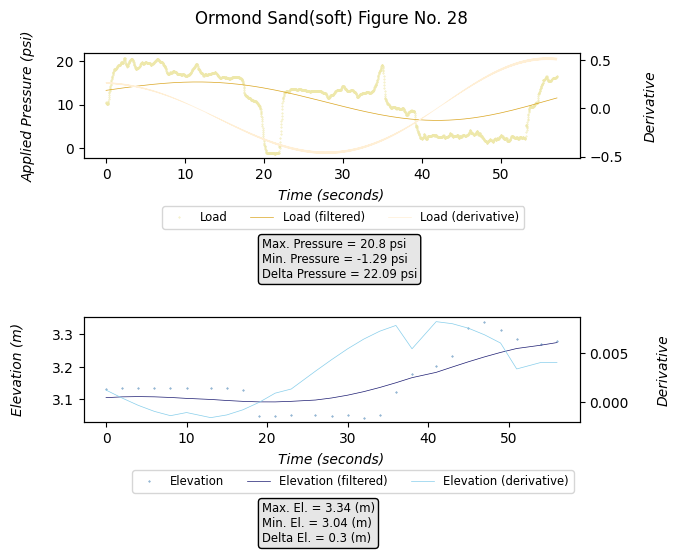

<Figure size 300x1200 with 0 Axes>

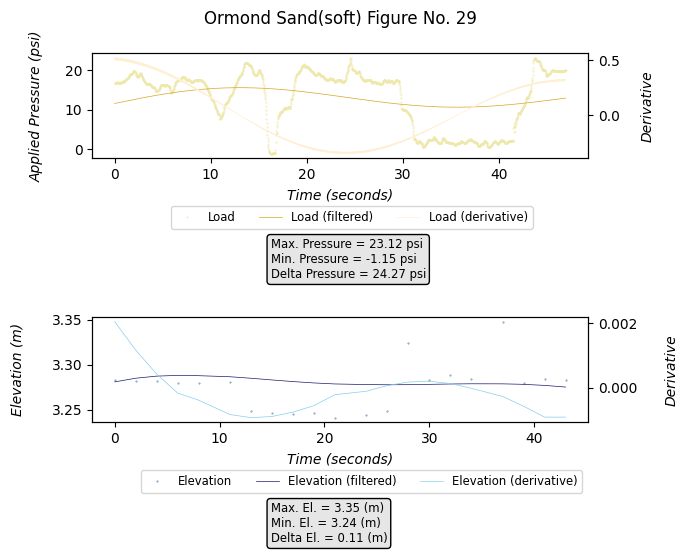

<Figure size 300x1200 with 0 Axes>

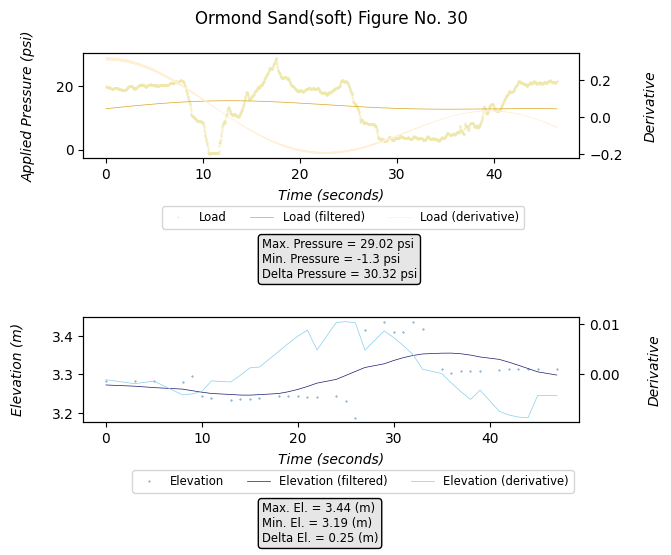

<Figure size 300x1200 with 0 Axes>

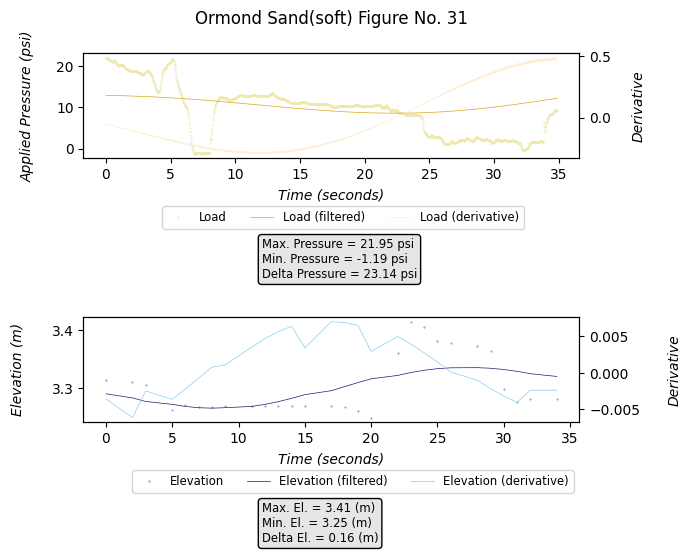

<Figure size 300x1200 with 0 Axes>

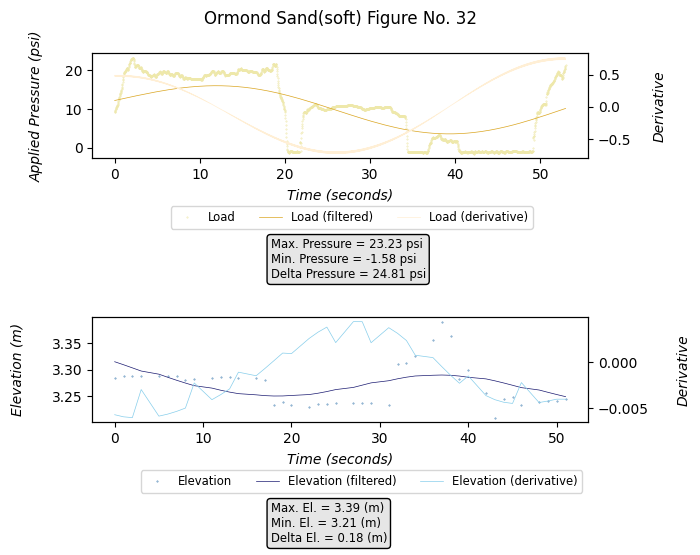

<Figure size 300x1200 with 0 Axes>

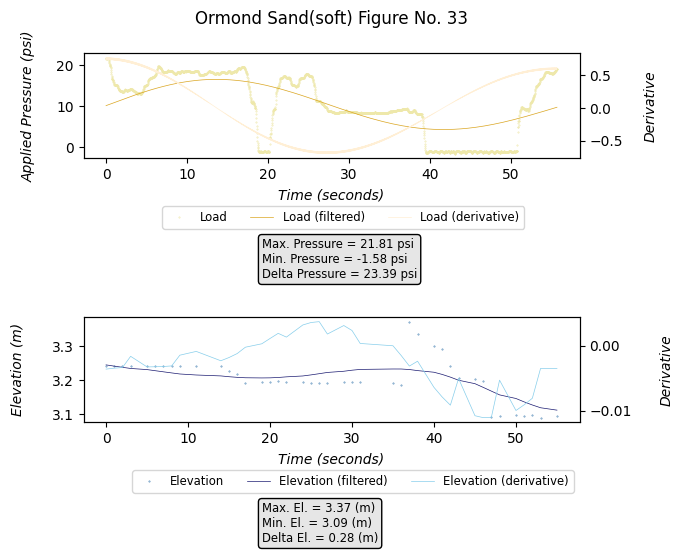

<Figure size 300x1200 with 0 Axes>

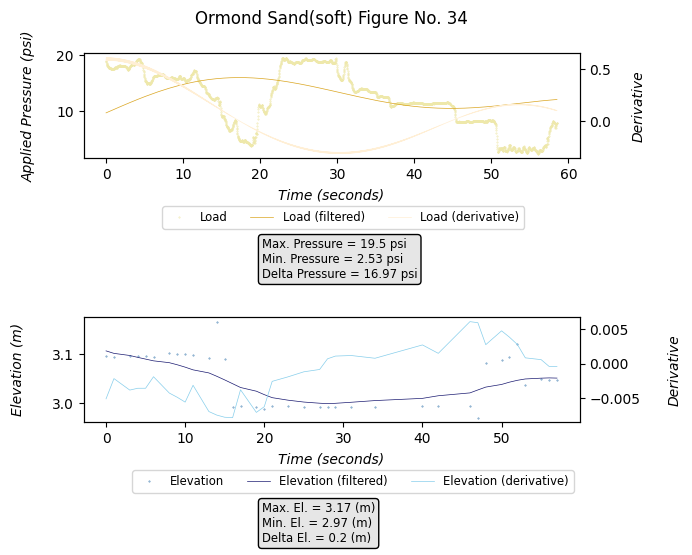

<Figure size 300x1200 with 0 Axes>

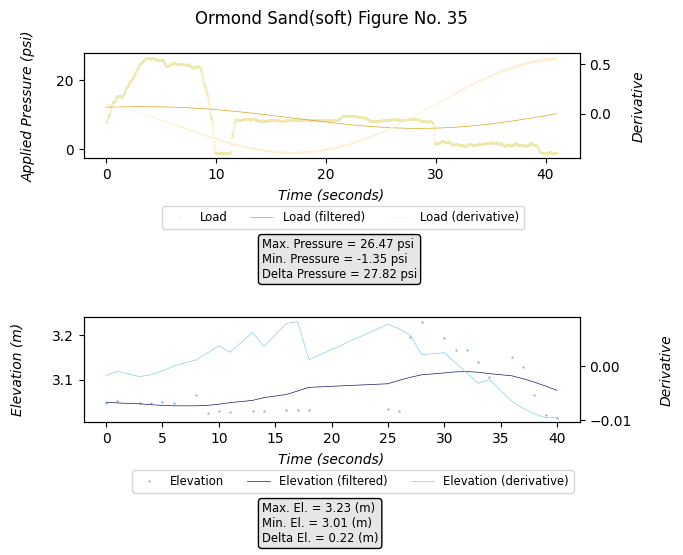

<Figure size 300x1200 with 0 Axes>

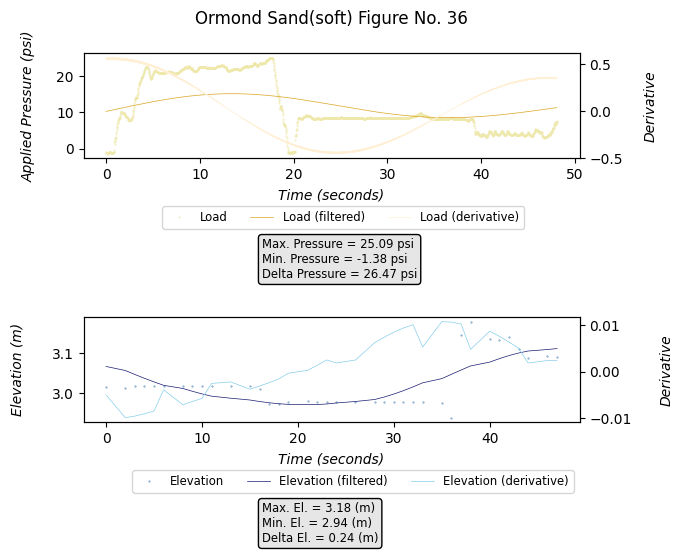

<Figure size 300x1200 with 0 Axes>

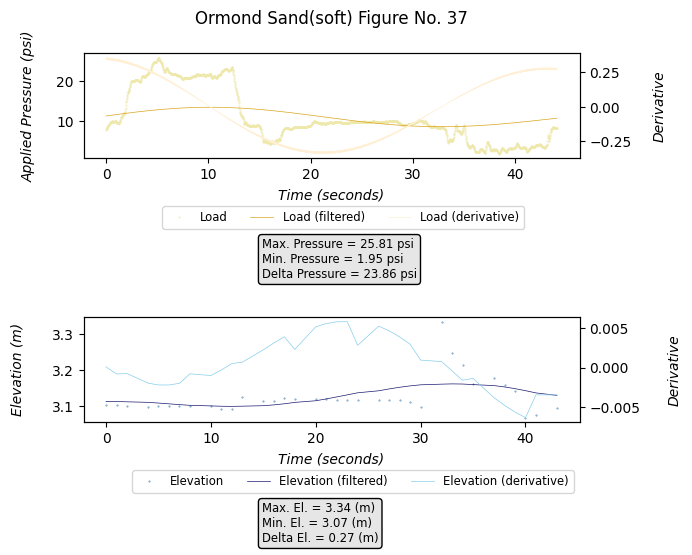

<Figure size 300x1200 with 0 Axes>

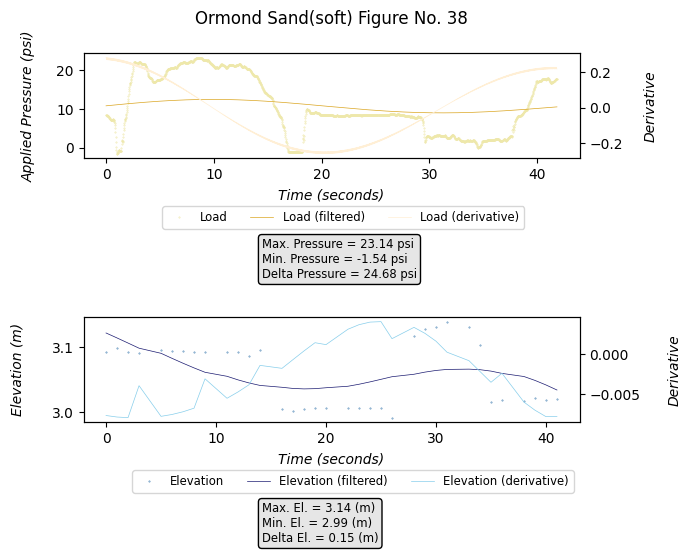

<Figure size 300x1200 with 0 Axes>

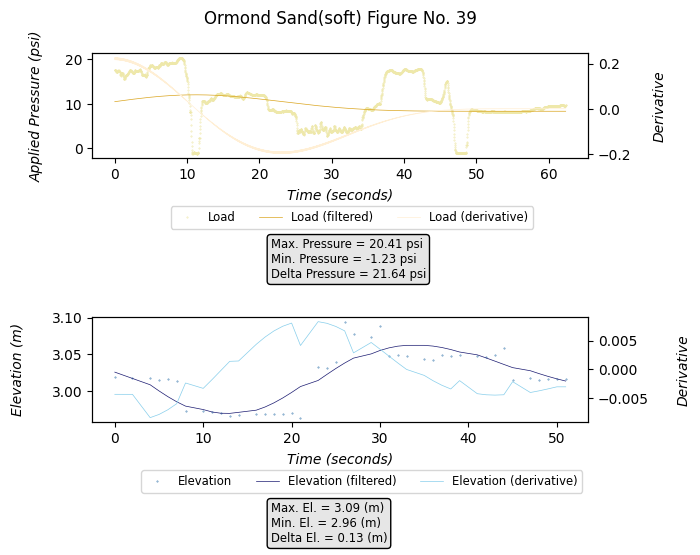

<Figure size 300x1200 with 0 Axes>

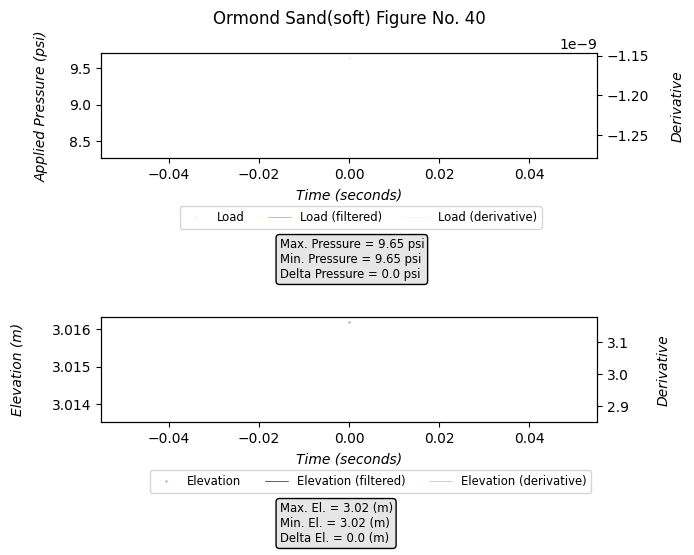

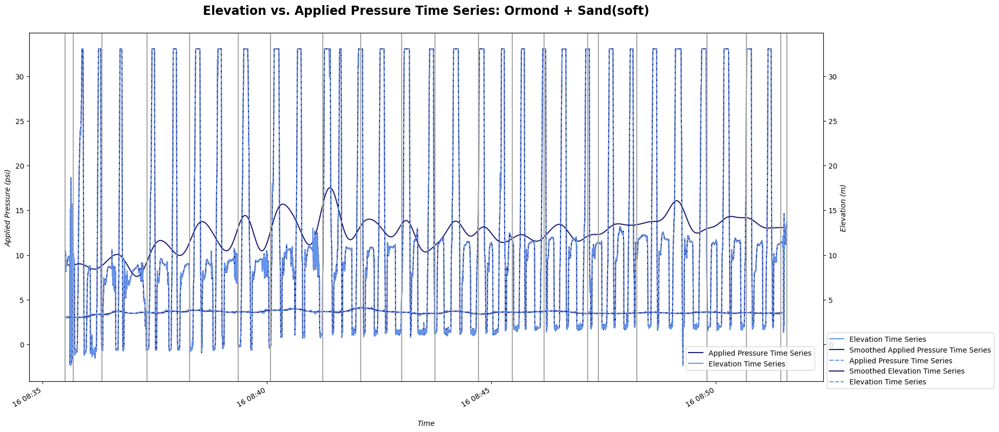

<Figure size 300x1200 with 0 Axes>

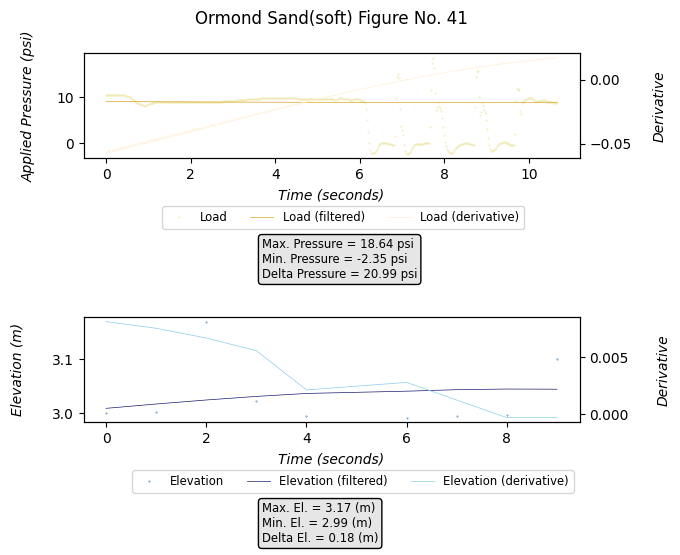

<Figure size 300x1200 with 0 Axes>

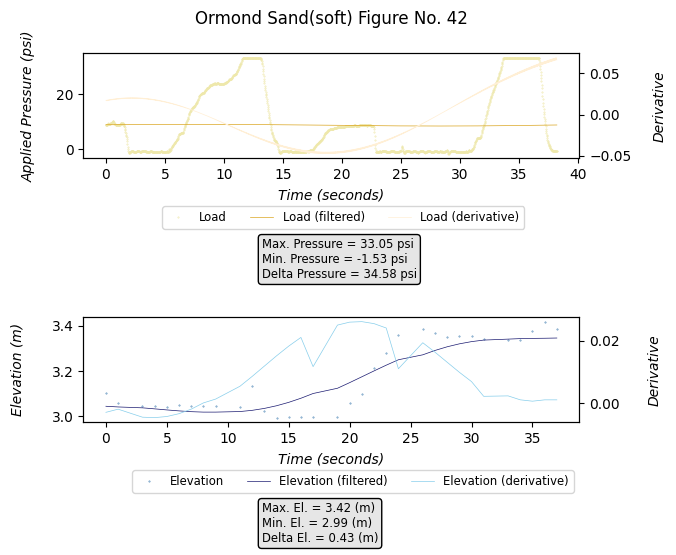

<Figure size 300x1200 with 0 Axes>

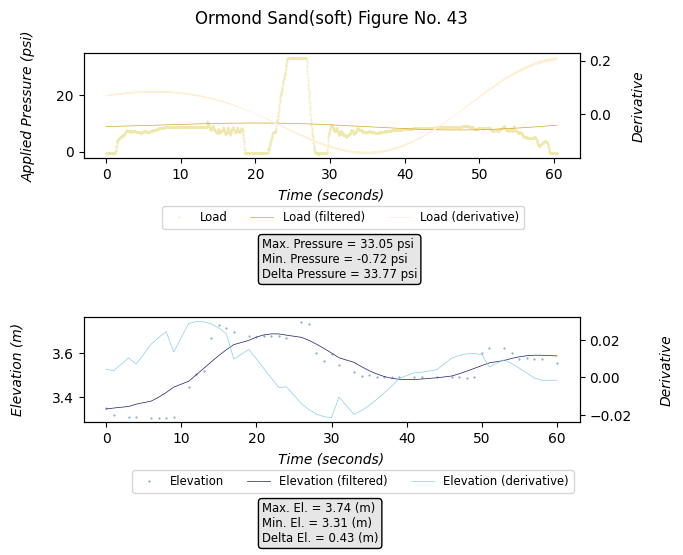

<Figure size 300x1200 with 0 Axes>

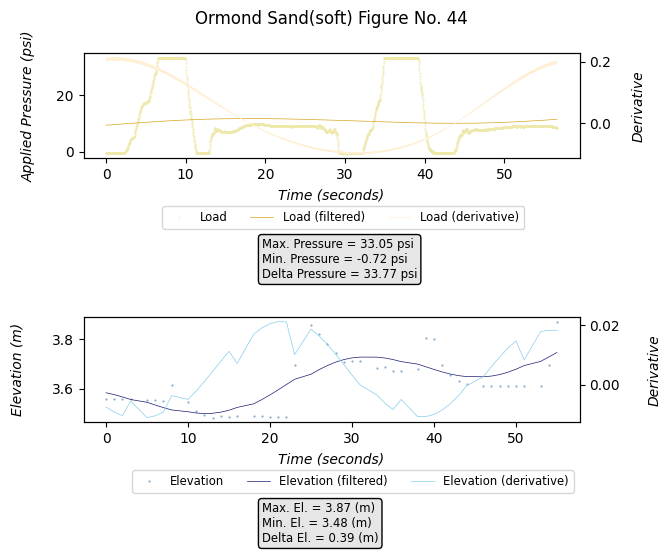

<Figure size 300x1200 with 0 Axes>

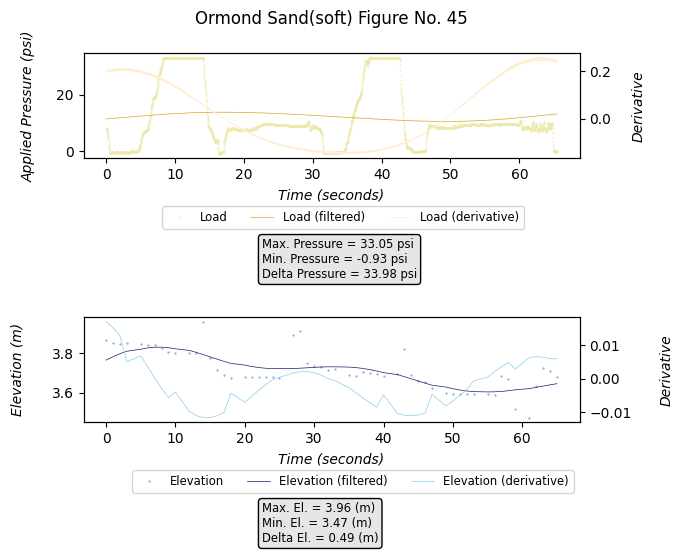

<Figure size 300x1200 with 0 Axes>

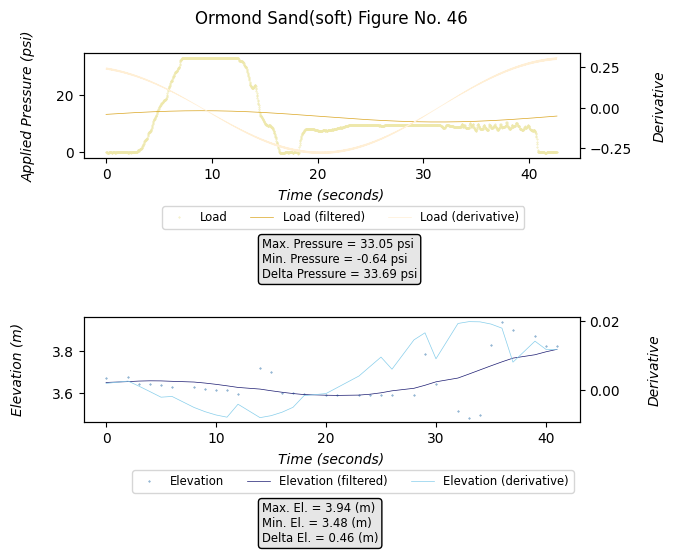

<Figure size 300x1200 with 0 Axes>

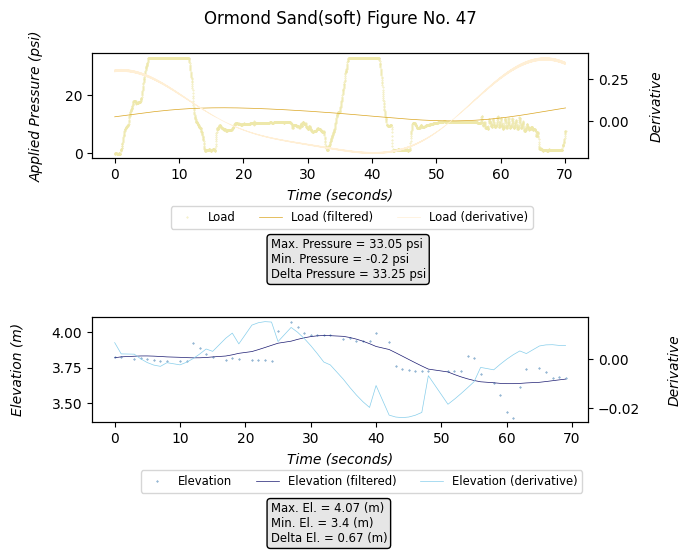

<Figure size 300x1200 with 0 Axes>

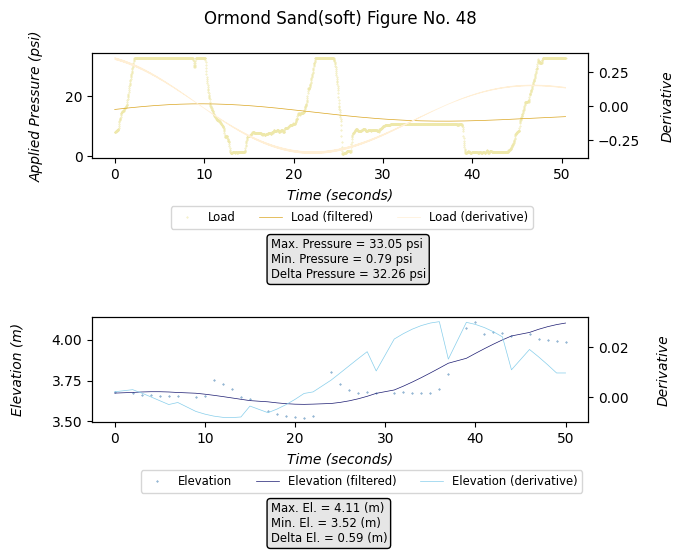

<Figure size 300x1200 with 0 Axes>

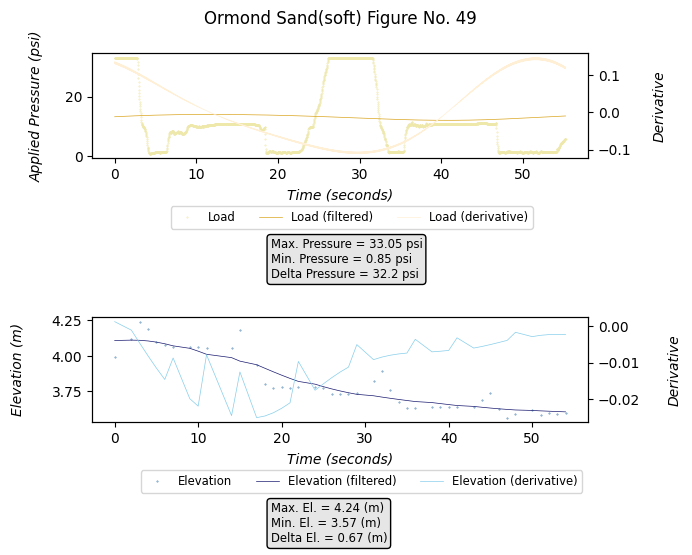

<Figure size 300x1200 with 0 Axes>

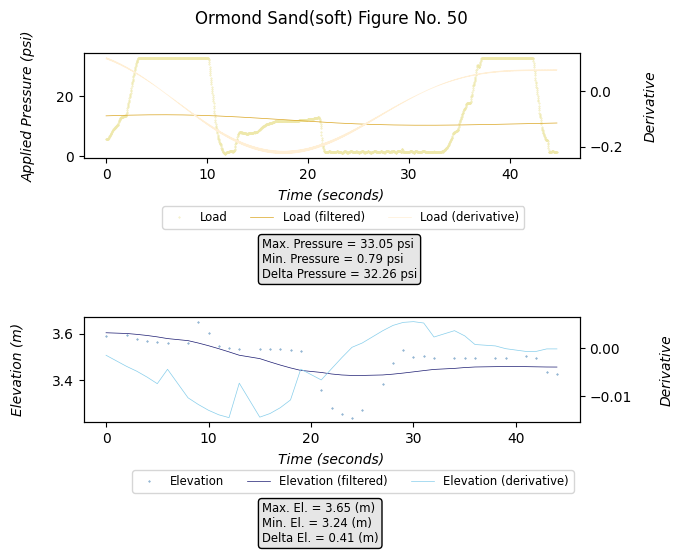

<Figure size 300x1200 with 0 Axes>

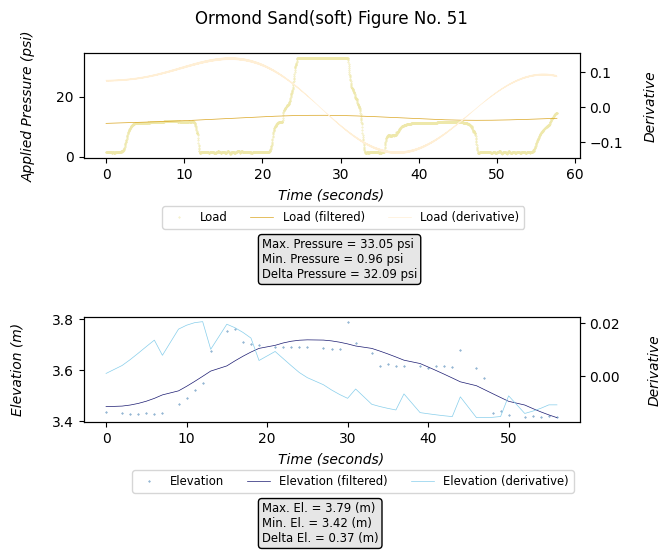

<Figure size 300x1200 with 0 Axes>

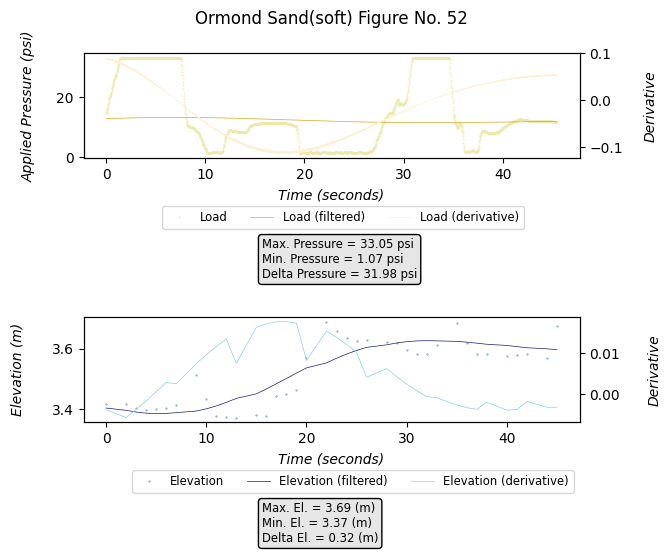

<Figure size 300x1200 with 0 Axes>

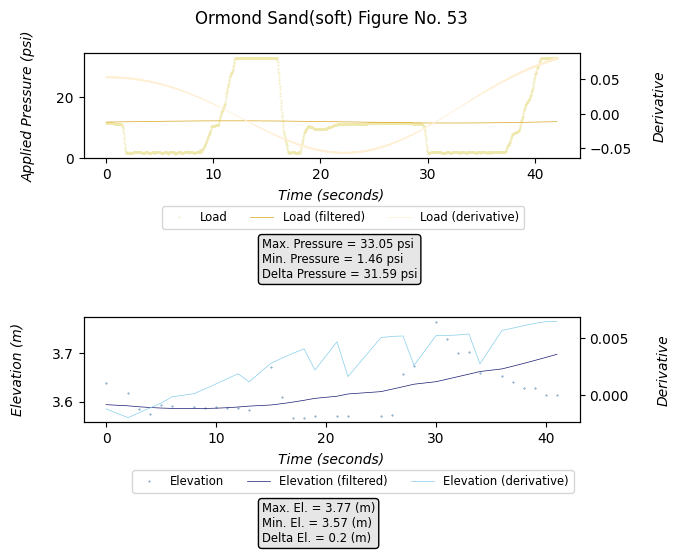

<Figure size 300x1200 with 0 Axes>

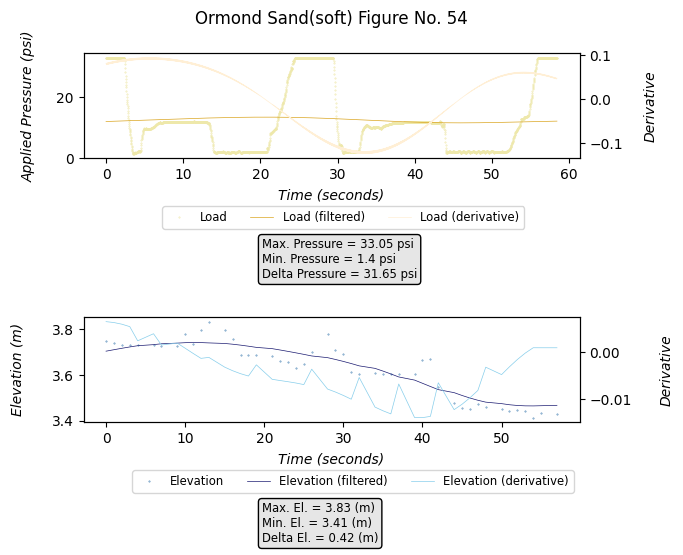

<Figure size 300x1200 with 0 Axes>

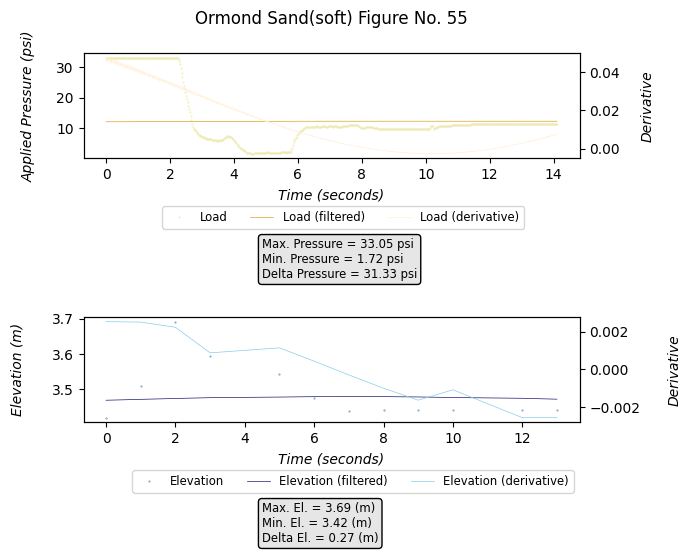

<Figure size 300x1200 with 0 Axes>

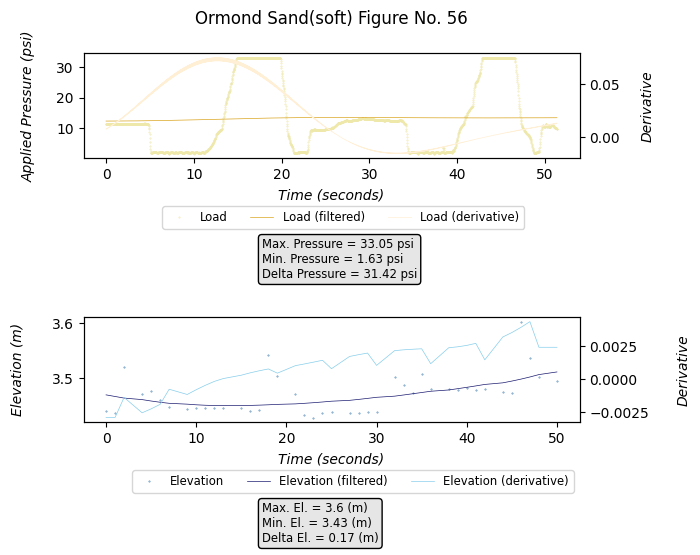

<Figure size 300x1200 with 0 Axes>

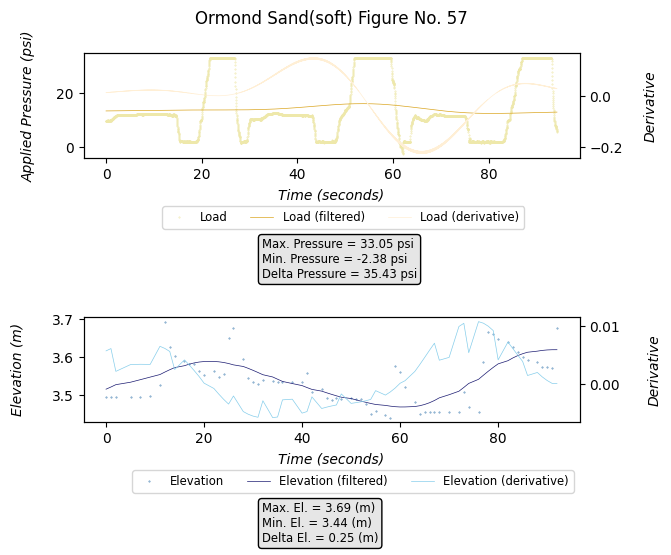

<Figure size 300x1200 with 0 Axes>

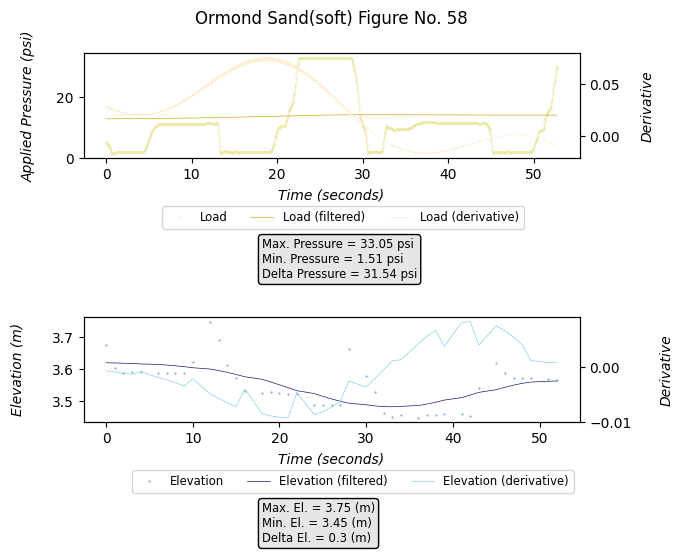

<Figure size 300x1200 with 0 Axes>

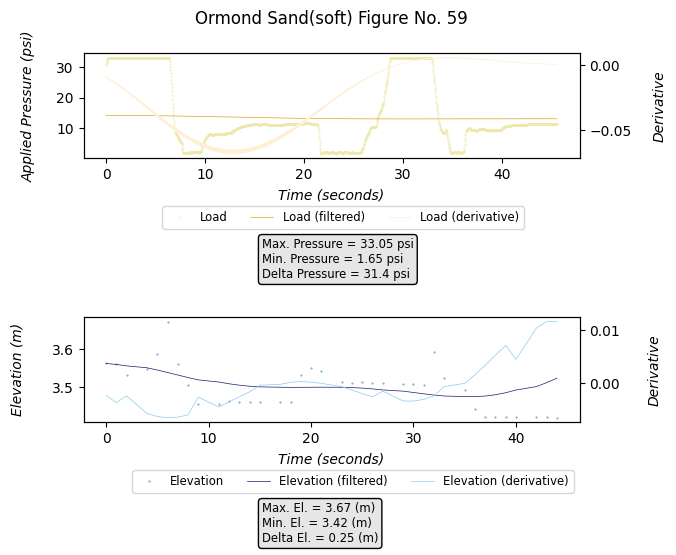

<Figure size 300x1200 with 0 Axes>

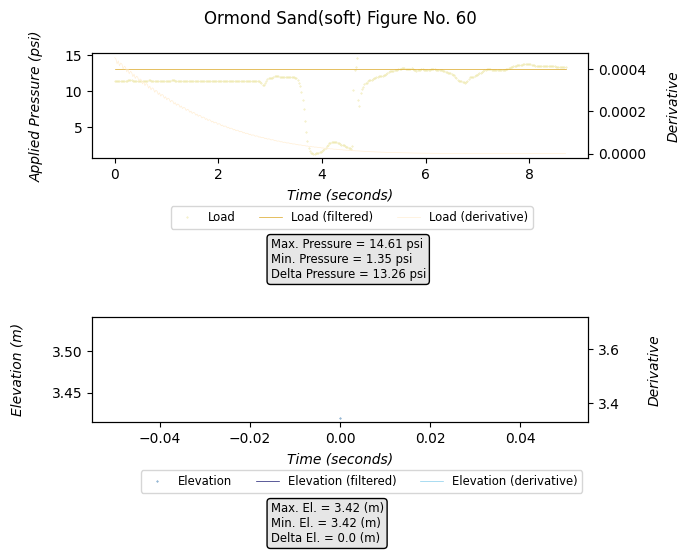

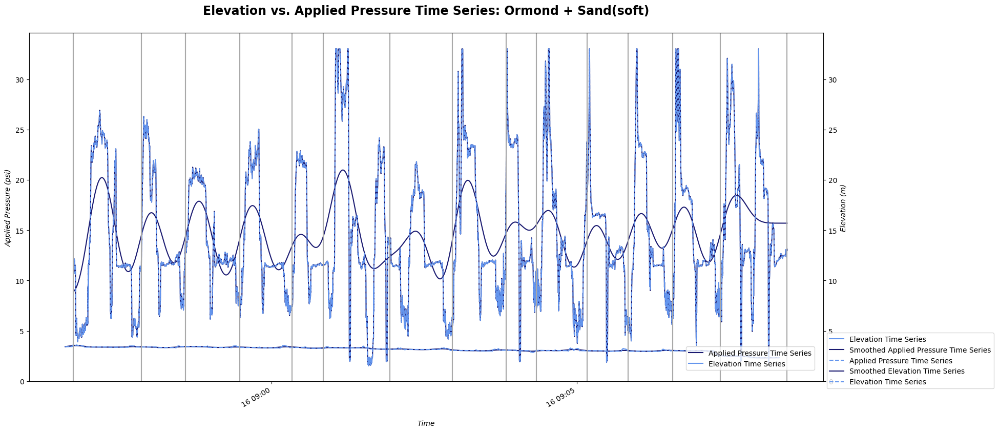

<Figure size 300x1200 with 0 Axes>

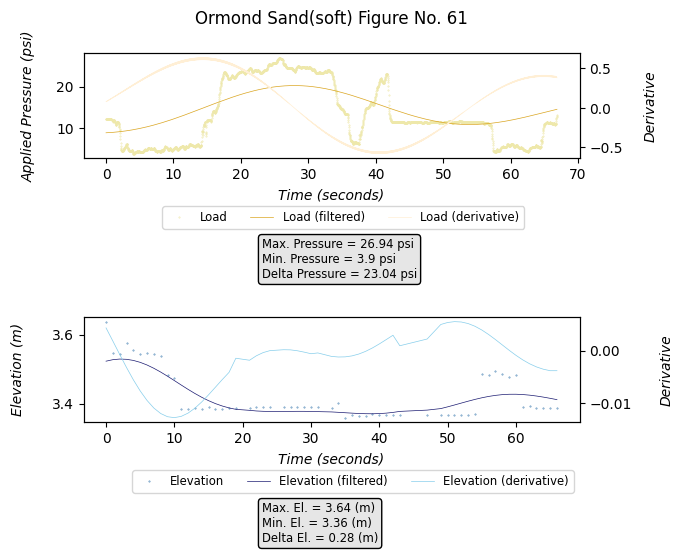

<Figure size 300x1200 with 0 Axes>

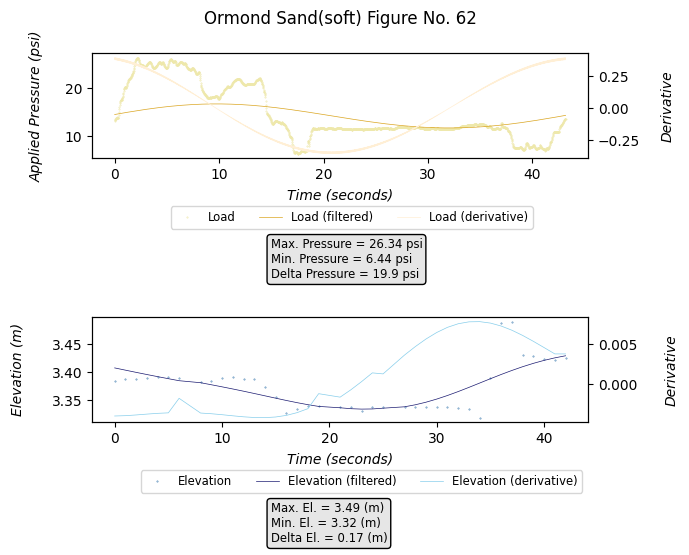

<Figure size 300x1200 with 0 Axes>

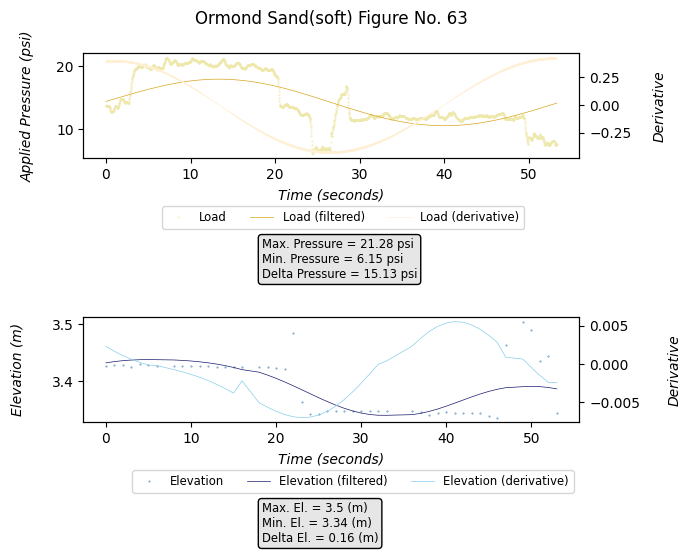

<Figure size 300x1200 with 0 Axes>

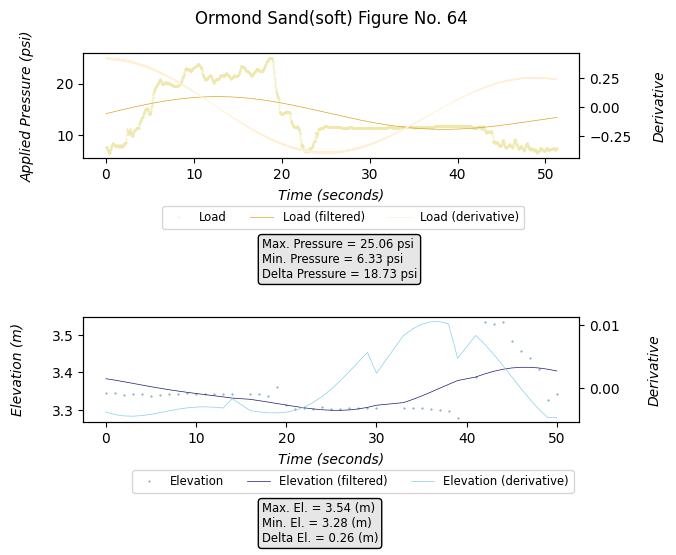

<Figure size 300x1200 with 0 Axes>

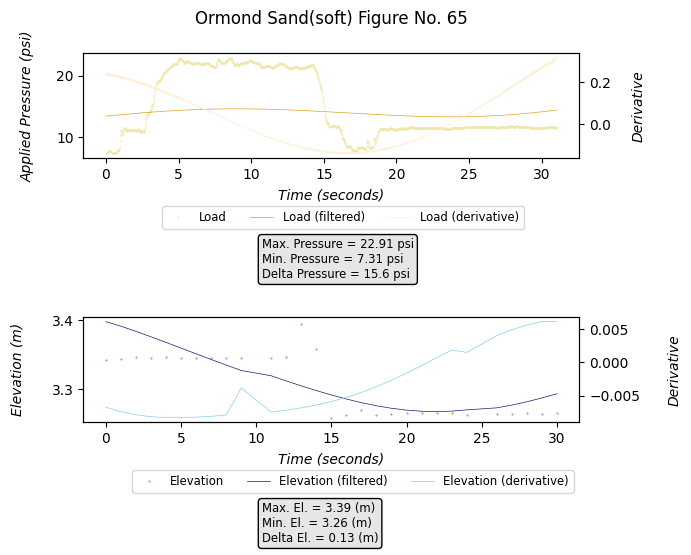

<Figure size 300x1200 with 0 Axes>

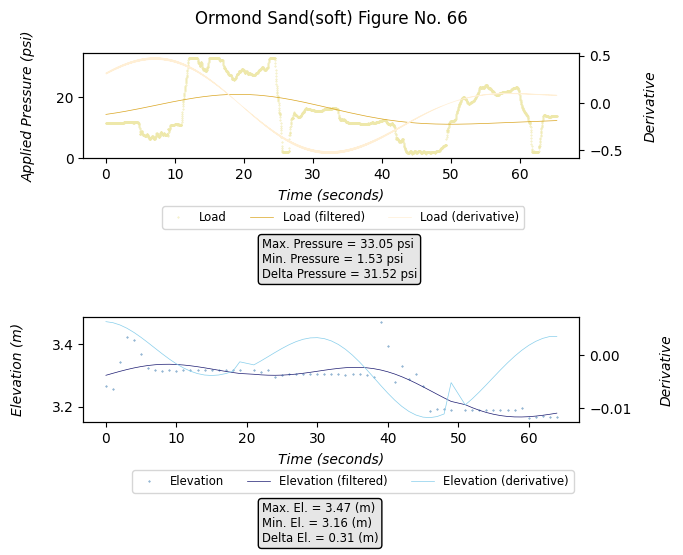

<Figure size 300x1200 with 0 Axes>

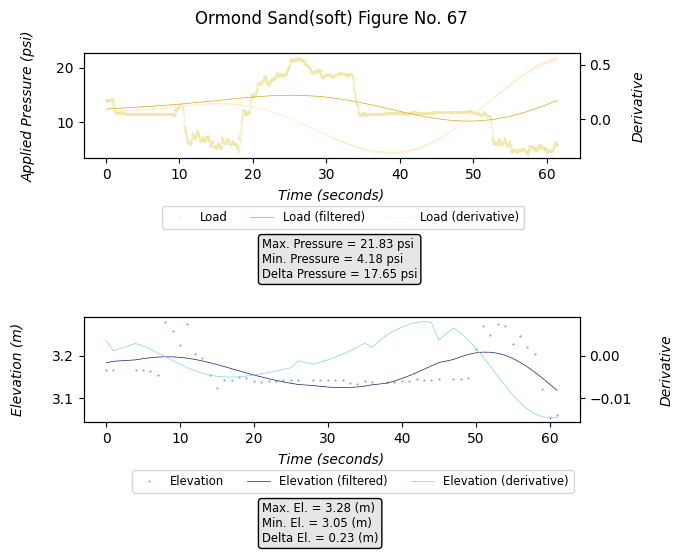

<Figure size 300x1200 with 0 Axes>

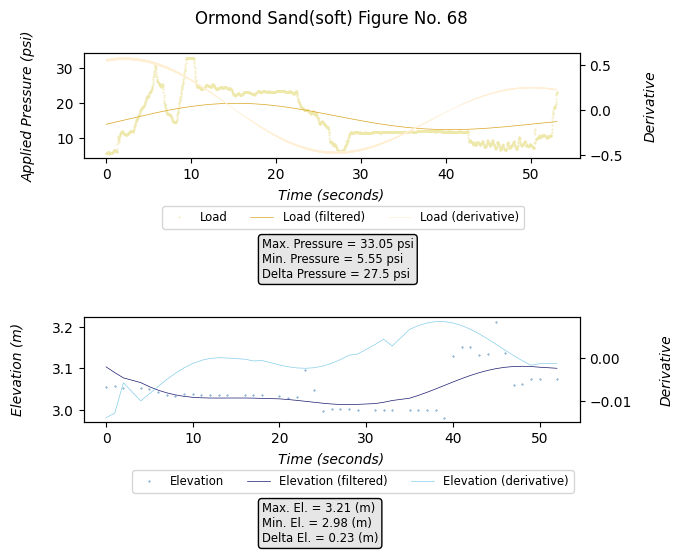

<Figure size 300x1200 with 0 Axes>

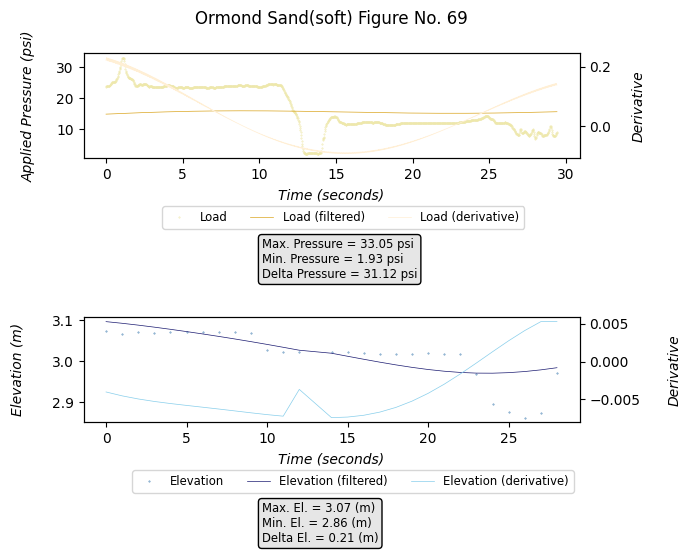

<Figure size 300x1200 with 0 Axes>

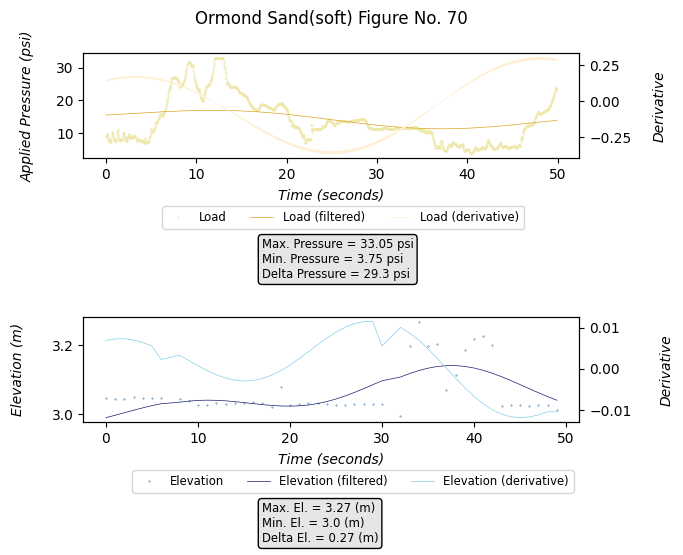

<Figure size 300x1200 with 0 Axes>

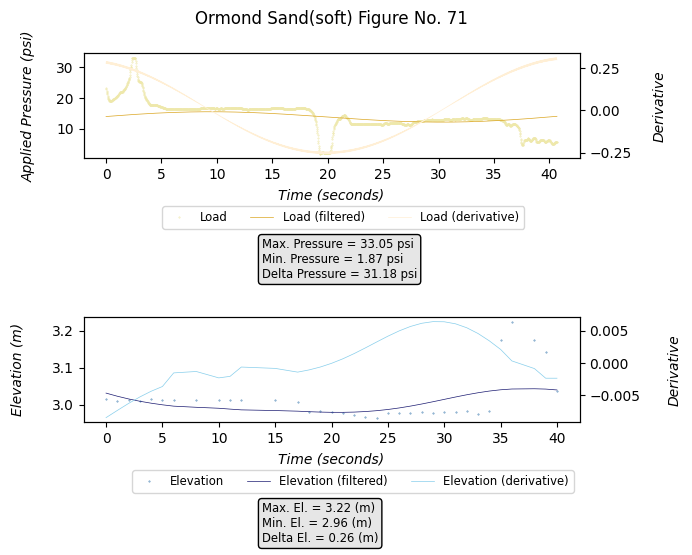

<Figure size 300x1200 with 0 Axes>

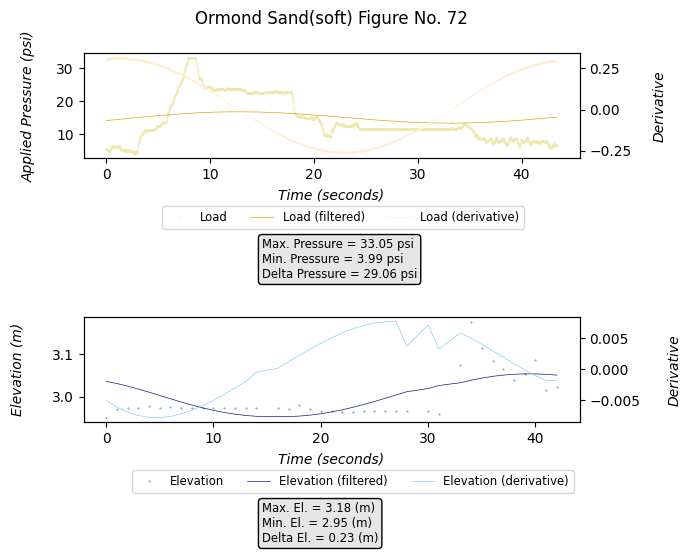

<Figure size 300x1200 with 0 Axes>

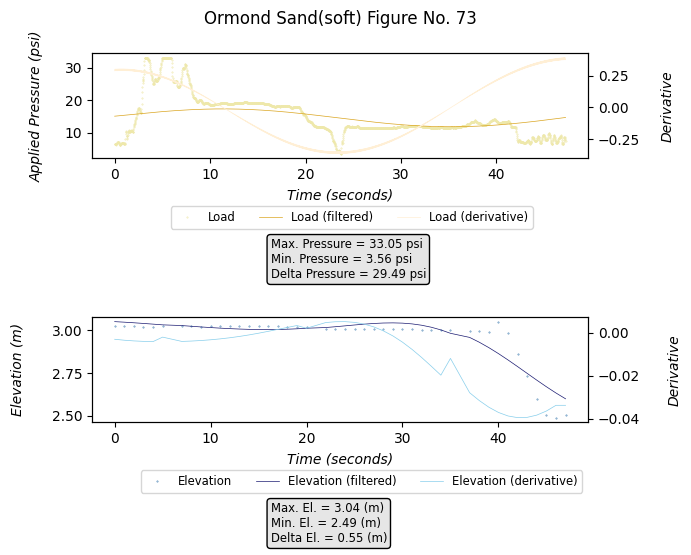

<Figure size 300x1200 with 0 Axes>

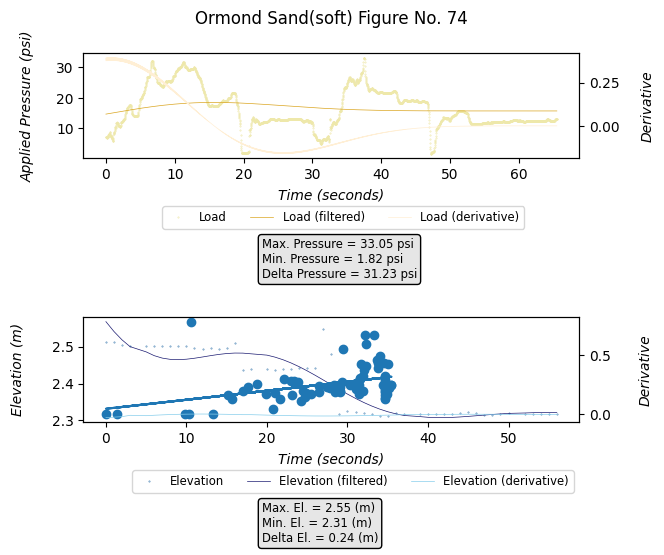

In [12]:
figure_number = 1

for file_ticker in range(0,len(rw5_files)):

  sessionName = 'CUAHSI_' + surface + str(file_ticker)
  sessionTitle = 'CUAHSI ' + location + ': ' + surface + f' #{file_ticker}'

  rw5fileName = rw5_files[file_ticker]
  INUSBHfileName = INUSBH_files[file_ticker]

  dict_load_delta_values = {}
  dict_Z_delta_values = {}

  #Read and verify imported .csv

  dfrw5 = pd.read_csv(rw5fileName)
  dfrw5 = dfrw5[dfrw5['GPS Time'].notna()]
  dfrw5 = dfrw5[dfrw5['GPS Date'].notna()]
  dfrw5 = dfrw5.reset_index()

  #Read and verify imported .xlsx

  dfINUSBH = pd.read_excel(INUSBHfileName)
  dfINUSBH.head(15)

  # Parse load:

  Load = [] #Blank "Load" list to be populated below

  for x in range(10,len(dfINUSBH['Unnamed: 1'])):
    Loadstring = -dfINUSBH['Unnamed: 1'][x] #Elevations indexed and converted to string format; INVERT compression data to be positive (hence negative sign)
    Load.append(Loadstring/area_toposhoe)

  LoadMAX = max(Load)
  LoadMIN = min(Load)
  LoadRANGE = max(Load) - min(Load)

  # Parse elevation:

  Z = [] #Blank "Z" list to be populated below

  for x in range(1,len(dfrw5['Local_Z'])): #for loop scans .csv column "Local_Z" and appends elevation values into empty "Z" list
    Zstring = dfrw5['Local_Z'][x] #Elevations indexed and converted to string format
    Z.append(Zstring)

  print(Z)

  # Parse time:

  TimeINUSBH = [] #Blank "Time" list to be populated below

  for x in range(10,len(dfINUSBH['IN-USBH - 617622'])):  #for loop scans .csv columns "GPS Time" and "GPS Date" and appends datetime values into empty "Time" list
    Timestring = str(dfINUSBH['IN-USBH - 617622'][x]) #Times indexed from Date and Time columns, converted to strings, and strung together in datetime readable format
    try:
      Timeobject = datetime.strptime(Timestring, '%Y-%m-%d %H:%M:%S.%f') #Times converted from string objects to datetime objects

    except:
      Timeobject = datetime.strptime(Timestring, '%Y-%m-%d %H:%M:%S')
    TimeINUSBH.append(Timeobject)

  print(TimeINUSBH)

  # Parse time:

  Timerw5 = [] #Blank "Time" list to be populated below

  for x in range(1,len(dfrw5['GPS Time'])):  #for loop scans .csv columns "GPS Time" and "GPS Date" and appends datetime values into empty "Time" list
    Timestring = str(dfrw5['GPS Date'][x]) + ' ' + str(dfrw5['GPS Time'][x]) #Times indexed from Date and Time columns, converted to strings, and strung together in datetime readable format
    Timeobject = datetime.strptime(Timestring, '%m-%d-%Y %H:%M:%S') #Times converted from string objects to datetime objects
    Timerw5.append(Timeobject)

  print(Timerw5)

  cutoff = 25
  fs = 50000

 #Plot time series

  fig, ax1 = plt.subplots(figsize=(20,10));

  ax1.plot(TimeINUSBH, Load, label="Applied Pressure Time Series", linestyle = '-', color = 'midnightblue');
  fig.autofmt_xdate();
  ax1.set_title(f'Elevation vs. Applied Pressure Time Series: {location} + {surface}\n', fontstyle = 'normal', fontsize = 17, weight = 'bold');
  ax1.set_ylabel('Applied Pressure (psi)', fontstyle = 'oblique');
  ax1.set_xlabel('\nTime', fontstyle = 'oblique');

  ax2 = ax1.twinx()

  ax2.plot(Timerw5, Z, label="Elevation Time Series", linestyle = '-', color= 'cornflowerblue');
  ax2.set_ylabel('RTK-GNSS Elevation (m)', fontstyle = 'oblique')


  fig.autofmt_xdate();
  fig.legend(bbox_to_anchor = (0.895,0.275));

  plt.savefig(f'{sessionName}_TimeSeries.png')

  smooth_and_slice(Load, TimeINUSBH);

  plt.plot(TimeINUSBH, Load_smooth, label= 'Smoothed Applied Pressure Time Series', linestyle = '-', color = 'midnightblue')
  plt.plot(TimeINUSBH, Load, linestyle = '--', label= 'Applied Pressure Time Series', color = 'cornflowerblue')

  plt.ylabel('Applied Pressure (psi)', fontstyle = 'oblique');
  plt.xlabel('\nTime', fontstyle = 'oblique');
  plt.legend(bbox_to_anchor = (1,0.15));

  for i in range(0,len(inflectionMidpointTrack)):
    plt.axvline(x = inflectionMidpointTrack[i], color = 'darkgrey')

  cutoff_Z = 2000
  fs_Z = 50000
  Z_smooth = butter_lowpass_filtfilt(Z, cutoff_Z, fs_Z);

  plt.plot(Timerw5, Z_smooth, label= 'Smoothed Elevation Time Series', linestyle = '-', color = 'midnightblue')
  plt.plot(Timerw5, Z, linestyle = '--', label= 'Elevation Time Series', color = 'cornflowerblue')

  plt.ylabel('Elevation (m)', fontstyle = 'oblique');
  plt.xlabel('\nTime', fontstyle = 'oblique');
  plt.legend(bbox_to_anchor = (1,0.15));

  for i in range(0,len(inflectionMidpointTrack)):
    plt.axvline(x = inflectionMidpointTrack[i], color = 'darkgrey')

  dictLoad_smooth = {}
  dictZ_smooth = {}
  dictZ = {}
  dictTimerw5 = {}

  for i in range(0, len(inflectionMidpointTrack)-1):
    #Define new list between inflection midpoints
    slice1 = take_closest(TimeINUSBH, inflectionMidpointTrack[i]);
    sliceIndex1 = TimeINUSBH.index(slice1);

    slice1_Z = take_closest(Timerw5, inflectionMidpointTrack[i]);
    sliceIndex1_Z = Timerw5.index(slice1_Z);

    slice2 = take_closest(TimeINUSBH, inflectionMidpointTrack[i+1]);
    sliceIndex2 = TimeINUSBH.index(slice2);

    slice2_Z = take_closest(Timerw5, inflectionMidpointTrack[i+1]);
    sliceIndex2_Z = Timerw5.index(slice2_Z);

    dictLoad_smooth['LS' + str(i)] = Load_smooth[sliceIndex1:sliceIndex2];
    dictZ['Z' + str(i)] = Z[sliceIndex1_Z:sliceIndex2_Z]
    dictZ_smooth['ZS' + str(i)] = Z_smooth[sliceIndex1_Z:sliceIndex2_Z];
    dictTimerw5['Trw5' + str(i)] = Timerw5[sliceIndex1_Z:sliceIndex2_Z];

  for i in range(0, len(dictTimerw5)):
    if i == 0:
      if dictTimerw5['Trw5' + str(i)] == []:
        placeHolder1 = dictTimerw5['Trw51'][0]
        placeHolder2 = dictZ['Z1'][0]
        placeHolder3 = dictZ_smooth['ZS1'][0]
        dictTimerw5['Trw50'] = [placeHolder1]
        dictZ['Z0'] = [placeHolder2]
        dictZ_smooth['ZS0'] = [placeHolder3]

    else:

      if dictTimerw5['Trw5' + str(i)] == []:
        placeHolder1 = dictTimerw5['Trw5' + str(i-1)][-1]
        placeHolder2 = dictZ['Z' + str(i-1)][-1]
        placeHolder3 = dictZ_smooth['ZS' + str(i-1)][-1]
        dictTimerw5['Trw5' + str(i)] = [placeHolder1]
        dictZ['Z' + str(i)] = [placeHolder2]
        dictZ_smooth['ZS' + str(i)] = [placeHolder3]

  for i in range(0, len(dictTimeINUSBH)):
    if i == 0:
      if dictTimeINUSBH['T' + str(i)] == []:
        placeHolder1 = dictTimeINUSBH['T1'][0]
        placeHolder2 = dictLoad['L1'][0]
        placeHolder3 = dictZ_smooth['LS1'][0]
        dictTimerw5['T0'] = [placeHolder1]
        dictLoad['L0'] = [placeHolder2]
        dictLoad_smooth['LS0'] = [placeHolder3]
    else:
      if dictTimeINUSBH['T' + str(i)] == []:
        placeHolder1 = dictTimeINUSBH['T' + str(i-1)][-1]
        placeHolder2 = dictLoad['L' + str(i-1)][-1]
        placeHolder3 = dictLoad_smooth['LS' + str(i-1)][-1]
        dictTimeINUSBH['T' + str(i)] = [placeHolder1]
        dictLoad['L' + str(i)] = [placeHolder2]
        dictLoad_smooth['LS' + str(i)] = [placeHolder3]

  dictTimeINUSBH_seconds = []
  dictTimerw5_seconds = []

  for i in range(0,len(dictTimeINUSBH)):
    dictTimeINUSBH_min = dictTimeINUSBH['T' + str(i)][0]
    dictTimeINUSBH_min_float = datetime.timestamp(dictTimeINUSBH_min)
    dictTimeINUSBH_max = dictTimeINUSBH['T' + str(i)][-1]
    dictTimeINUSBH_max_float = datetime.timestamp(dictTimeINUSBH_max)
    dictTimeINUSBH_range = dictTimeINUSBH_max - dictTimeINUSBH_min
    dictTimeINUSBH_range_float = dictTimeINUSBH_max_float - dictTimeINUSBH_min_float
    dictTimeINUSBH_seconds.append(dictTimeINUSBH_range_float)

    dictTimeINUSBH_current = dictTimeINUSBH['T' + str(i)]

    for n in range(0, len(dictTimeINUSBH_current)):
      dictTimeINUSBH['T' + str(i)][n] = datetime.timestamp(dictTimeINUSBH['T' + str(i)][n]) - dictTimeINUSBH_min_float

    dictTimerw5_min = dictTimerw5['Trw5' + str(i)][0]
    dictTimerw5_min_float = datetime.timestamp(dictTimerw5_min)
    dictTimerw5_max = dictTimerw5['Trw5' + str(i)][-1]
    dictTimerw5_max_float = datetime.timestamp(dictTimerw5_max)
    dictTimerw5_range = dictTimerw5_max - dictTimerw5_min
    dictTimerw5_range_float = dictTimerw5_max_float - dictTimerw5_min_float
    dictTimerw5_seconds.append(dictTimerw5_range_float)

    dictTimerw5_current = dictTimerw5['Trw5' + str(i)]

    for m in range(0, len(dictTimerw5_current)):
      dictTimerw5['Trw5' + str(i)][m] = datetime.timestamp(dictTimerw5['Trw5' + str(i)][m]) - dictTimerw5_min_float

  #Calculate derivatives:

  dictLoad_derivative = {}
  dictZ_derivative = {}

  for i in range(0, len(dictLoad_smooth)):

    dictIndexL_current = dictLoad_smooth['LS' + str(i)]

    listLoad_current = []

    for n in range(1, len(dictIndexL_current)):

      L_N = dictLoad_smooth['LS' + str(i)][n]
      L_Nm1 = dictLoad_smooth['LS' + str(i)][n-1]

      TL_N = dictTimeINUSBH['T' + str(i)][n]
      TL_Nm1 = dictTimeINUSBH['T' + str(i)][n-1]

      valueLoad_current = (L_N - L_Nm1)/(TL_N - TL_Nm1)
      listLoad_current.append(valueLoad_current)

    listLoad_current.append(valueLoad_current)
    dictLoad_derivative["L'" + str(i)] = listLoad_current


    dictIndexZ_current = dictZ_smooth['ZS' + str(i)]

    listZ_current = []

    if len(listZ_current) == 1:
      valueZ_current = listZ_current[0]

    if len(listZ_current) == 0:

      try:
       valueZ_current = dictZ_smooth['ZS' + str(i-1)][-1]

      except:
         valueZ_current = dictZ_smooth['ZS' + str(i+1)][0]

    for m in range(1,len(dictIndexZ_current)):
      Z_N = dictZ_smooth['ZS' + str(i)][m]
      Z_Nm1 = dictZ_smooth['ZS' + str(i)][m-1]

      TZ_N = dictTimerw5['Trw5' + str(i)][m]
      TZ_Nm1 = dictTimerw5['Trw5' + str(i)][m-1]

      valueZ_current = (Z_N - Z_Nm1)/(TZ_N - TZ_Nm1)
      listZ_current.append(valueZ_current)

    listZ_current.append(valueZ_current)
    dictZ_derivative["Z'" + str(i)] = listZ_current

  # loop through the length of tickers and keep track of index
  delLoadValues = []
  delZValues = []

  for n, listLoad in enumerate(dictLoad):
    figWidth = 3
    figHeight = 4*figWidth

    plt.figure(figsize=(figWidth, figHeight));

    # add a new subplot iteratively

    fig, (ax1, ax2) = plt.subplots(2);

    fig.subplots_adjust(hspace = 1.5);

    parax1 = ax1.twinx();

    ax1.plot(dictTimeINUSBH['T' + str(n)], dictLoad['L' + str(n)], linestyle = '', marker = '.', markersize = 0.75, color = 'palegoldenrod', label = 'Load');
    ax1.plot(dictTimeINUSBH['T' + str(n)], dictLoad_smooth['LS' + str(n)], linestyle = '-', linewidth = 0.5, color = 'goldenrod', label = 'Load (filtered)');
    ax1.plot(0,dictLoad_smooth['LS' + str(n)][0], linestyle = '-', linewidth = 0.5, color = 'papayawhip', label = 'Load (derivative)');
    parax1.plot(dictTimeINUSBH['T' + str(n)], dictLoad_derivative["L'" + str(n)], linestyle = '-', linewidth = 0.5, color = 'papayawhip', label = 'Load (derivative)');

    # ax[1] = ax.twinx()

    parax2 = ax2.twinx();

    ax2.plot(dictTimerw5['Trw5' + str(n)], dictZ['Z' + str(n)], linestyle = '', marker = '.', markersize = 0.75, color = 'steelblue', label = 'Elevation');
    ax2.plot(dictTimerw5['Trw5' + str(n)], dictZ_smooth['ZS' + str(n)], linestyle = '-', linewidth = 0.5, color = 'midnightblue', label = 'Elevation (filtered)');
    ax2.plot(0,dictZ_smooth['ZS' + str(n)][0], linestyle = '-', linewidth = 0.5, color = 'skyblue', label = 'Elevation (derivative)');
    parax2.plot(dictTimerw5['Trw5' + str(n)], dictZ_derivative["Z'" + str(n)], linestyle = '-', linewidth = 0.5, color = 'skyblue', label = 'Elevation (derivative)');

    # chart formatting
    ax1.set_title(f'{location} {surface} Figure No. {figure_number}\n')

    ax1.set_xlabel('Time (seconds)', fontstyle = 'italic');
    ax1.set_ylabel('Applied Pressure (psi)', fontstyle = 'italic', labelpad = 15);
    parax1.set_ylabel('Derivative', fontstyle = 'italic', labelpad = 15);
    ax1.legend(bbox_to_anchor = (0.90,-.40), ncol = 3, fontsize = 'smaller');

    ax2.set_xlabel('Time (seconds)', fontstyle = 'italic');
    ax2.set_ylabel('Elevation (m)', fontstyle = 'italic', labelpad = 20);
    parax2.set_ylabel('Derivative', fontstyle = 'italic', labelpad = 20);
    ax2.legend(bbox_to_anchor = (1,-.40), ncol = 3, fontsize = 'smaller');

    ax2.set_title('\n')

    listLoadCurrent = dictLoad['L' + str(n)];
    listZCurrent = dictZ['Z' + str(n)];

    maxLoadValue = round(max(listLoadCurrent),2);
    minLoadValue = round(min(listLoadCurrent),2);
    delLoadValue = round(maxLoadValue - minLoadValue, 2);
    delLoadValues.append(delLoadValue);

    maxZValue = round(max(listZCurrent),2);
    minZValue = round(min(listZCurrent),2);
    delZValue = round(maxZValue - minZValue, 2);
    delZValues.append(delZValue)

    ax1.annotate(f'Max. Pressure = {maxLoadValue} psi\nMin. Pressure = {minLoadValue} psi\nDelta Pressure = {delLoadValue} psi',
              xy=(0.4, -1.35), xycoords='axes fraction',
              xytext=(-20, 20), textcoords='offset pixels',
              horizontalalignment='left',
              verticalalignment='bottom',
              fontsize = 'smaller',
              bbox = dict(boxstyle = 'round', fc = '0.9'));

    ax2.annotate(f'Max. El. = {maxZValue} (m)\nMin. El. = {minZValue} (m)\nDelta El. = {delZValue} (m)',
              xy=(0.4, -1.35), xycoords='axes fraction',
              xytext=(-20, 20), textcoords='offset pixels',
              horizontalalignment='left',
              verticalalignment='bottom',
              fontsize = 'smaller',
              bbox = dict(boxstyle = 'round', fc = '0.9'));

    plt.savefig(f'{sessionName}_Clip{n}.png', bbox_inches = 'tight')

    figure_number += 1

  print(f'length of delLoadValues #{file_ticker}: {len(delLoadValues)}')
  print(f'length of delZValues #{file_ticker}: {len(delZValues)}\n')

  print(f'delLoad: {delLoadValues}')
  print(f'delZ: {delZValues}\n')

  dict_load_delta_values['lD' + str(file_ticker)] = delLoadValues

  for list_ticker in range(0, len(delLoadValues)):
    load_delta_values.append(delLoadValues[list_ticker])

  dict_Z_delta_values['zD' + str(file_ticker)] = delZValues

  for list_ticker in range(0, len(delZValues)):
    Z_delta_values.append(delZValues[list_ticker])

#find line of best fit
slope, intercept = np.polyfit(load_delta_values, Z_delta_values, 1)

#add points to plot
plt.scatter(load_delta_values, Z_delta_values)

fit_line = []

for i in range(0,len(load_delta_values)):
  fit_line.append(slope * load_delta_values[i] + intercept)

#add line of best fit to plot
plt.plot(load_delta_values, fit_line, linestyle = '-')

r_array = np.corrcoef(np.array(load_delta_values), np.array(Z_delta_values))
r_value = r_array[0,1]
print(r_value)

0.40484131783483573


<ipython-input-13-b57b1b2d9f1f>:23: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  plt.annotate(f'R = {round(r_value,3)}\nLine of Best Fit = {round(slope,3)}*x + {round(intercept,2)}',


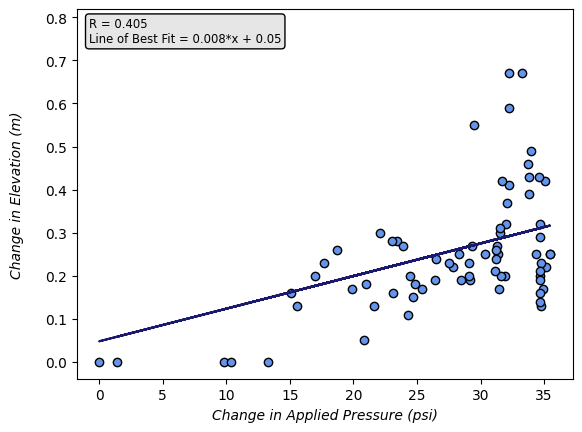

In [13]:
#find line of best fit
slope, intercept = np.polyfit(load_delta_values, Z_delta_values, 1)

#add points to plot
plt.scatter(load_delta_values, Z_delta_values, color = 'cornflowerblue', edgecolor = 'k')

fit_line = []

for i in range(0,len(load_delta_values)):
  fit_line.append(slope * load_delta_values[i] + intercept)

#add line of best fit to plot
plt.plot(load_delta_values, fit_line, linestyle = '-', color = 'midnightblue')

# print(r2_score(lS, zS))
r_array = np.corrcoef(np.array(load_delta_values), np.array(Z_delta_values))
r_value = r_array[0,1]
print(r_value)

plt.savefig(f'{location}_{surface}_DeltaValues.png', bbox_inches = 'tight')

plt.annotate(f'R = {round(r_value,3)}\nLine of Best Fit = {round(slope,3)}*x + {round(intercept,2)}',
              xy=(0.025, 0.975), xycoords='axes fraction',
              textcoords='offset pixels',
              horizontalalignment='left',
              verticalalignment='top',
              fontsize = 'smaller',
              bbox = dict(boxstyle = 'round', fc = '0.9'));

plt.xlabel('Change in Applied Pressure (psi)', fontstyle = 'italic');
plt.ylabel('Change in Elevation (m)', fontstyle = 'italic', labelpad = 15);

In [14]:
from statistics import mean

avg_delta_Load = mean(load_delta_values)
avg_delta_Z = mean(Z_delta_values)

print(avg_delta_Load)
print(avg_delta_Z)

27.374324324324323
0.25527027027027027


In [15]:
!zip -r /content/file.zip /content
from google.colab import files
files.download("/content/file.zip")

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/.last_update_check.json (deflated 22%)
  adding: content/.config/default_configs.db (deflated 98%)
  adding: content/.config/gce (stored 0%)
  adding: content/.config/active_config (stored 0%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2024.04.04/ (stored 0%)
  adding: content/.config/logs/2024.04.04/13.23.27.973093.log (deflated 91%)
  adding: content/.config/logs/2024.04.04/13.24.28.357022.log (deflated 57%)
  adding: content/.config/logs/2024.04.04/13.23.55.253222.log (deflated 58%)
  adding: content/.config/logs/2024.04.04/13.24.16.708234.log (deflated 58%)
  adding: content/.config/logs/2024.04.04/13.24.06.850857.log (deflated 86%)
  adding: content/.config/logs/2024.04.04/13.24.29.089504.log (deflated 57%)
  adding: content/.config

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>